# EYE FOR BLIND
This notebook will be used to prepare the capstone project 'Eye for Blind'

### By: Tashi Dhondup

In [1]:
#Import all the required libraries
import pandas as pd
import numpy as np
import os 
import glob
import re
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from tqdm import tqdm
import time
from skimage import io

import nltk
from collections import Counter
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import sentence_bleu

import tensorflow as tf
from keras.utils import plot_model 

from gtts import gTTS
from playsound import playsound
from IPython import display

In [155]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
tf.test.is_built_with_cuda()

True

Let's read the dataset

## Data understanding
1.Import the dataset and read image & captions into two seperate variables

2.Visualise both the images & text present in the dataset

3.Create a dataframe which summarizes the image, path & captions as a dataframe

4.Create a list which contains all the captions & path

5.Visualise the top 30 occuring words in the captions



In [3]:
#Import the dataset and read the image into a seperate variable

images = 'data/Images'

all_imgs = glob.glob(images + '/*.jpg', recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


In [4]:
def print_image(index):
    image_path = all_imgs[index]
    img = io.imread(image_path)
    img_name = image_path[len(images)+1:len(image_path)]
#     print(f"Image name: {img_name}")
    return img, img_name

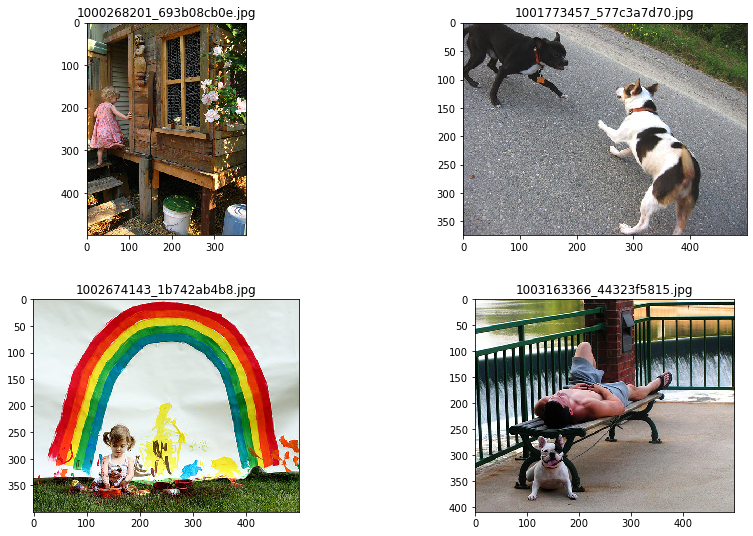

In [5]:
#Visualise both the images & text present in the dataset

# visulizing first 4 images

fig, axs = plt.subplots(2,2, figsize=(15, 9), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .3, wspace=.1)
# ax = ax.flatten()
for i, ax in enumerate(axs.ravel()):
    img, name = print_image(i)
    ax.imshow(img, cmap=None, interpolation='none')
    ax.set_title(name)
    
# https://stackoverflow.com/questions/43957776/numpy-ndarray-object-has-no-attribute-imshow#:~:text=fig%2C%20axs%20%3D%20plt.subplots(ncols%3D2%2C%20nrows%3D3%2C%20figsize%3D(8%2C%2010))%0Afor%20i%2C%20ax%20in%20enumerate(axs.ravel())%3A%0A%20%20%20%20ax.imshow(img%5Bi%5D)

In [6]:
CAPTION_PATH = "data/" + 'captions.txt'

In [7]:
def load_doc(filename):
    """
    
    """
    
    text = open(filename).read()
    
    return text

doc = load_doc(CAPTION_PATH)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


In [8]:
def get_Id_Path_Caption(text):
    """
    
    """
    
    Id = []
    path = []
    caption = []
    text = text.splitlines()[1:] # skipping first Row cause it only have column name
    
    for line in text:
        com_index = line.index(",")
        #getting image ID
        img_Id = line[:com_index]
        Id.append(img_Id)
        
        caption.append(line[com_index+1:])
        path.append(images + "/" + img_Id)
    
    return Id, path, caption
    

Create a dataframe which summarizes the image, path & captions as a dataframe

Each image id has 5 captions associated with it therefore the total dataset should have 40455 samples.

In [9]:
a,b,c = get_Id_Path_Caption(doc)
all_img_id= a       #store all the image id here
all_img_vector= b   #store all the image path here
annotations = c     #store all the captions here

# print(a,b,c)
df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)), columns =['ID','Path', 'Captions']) 
    
df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,data/Images/1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,data/Images/1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,data/Images/1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,data/Images/1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,data/Images/1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,data/Images/997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,data/Images/997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,data/Images/997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,data/Images/997722733_0cb5439472.jpg,A rock climber in a red shirt .


### Lets visualize both image and caption.

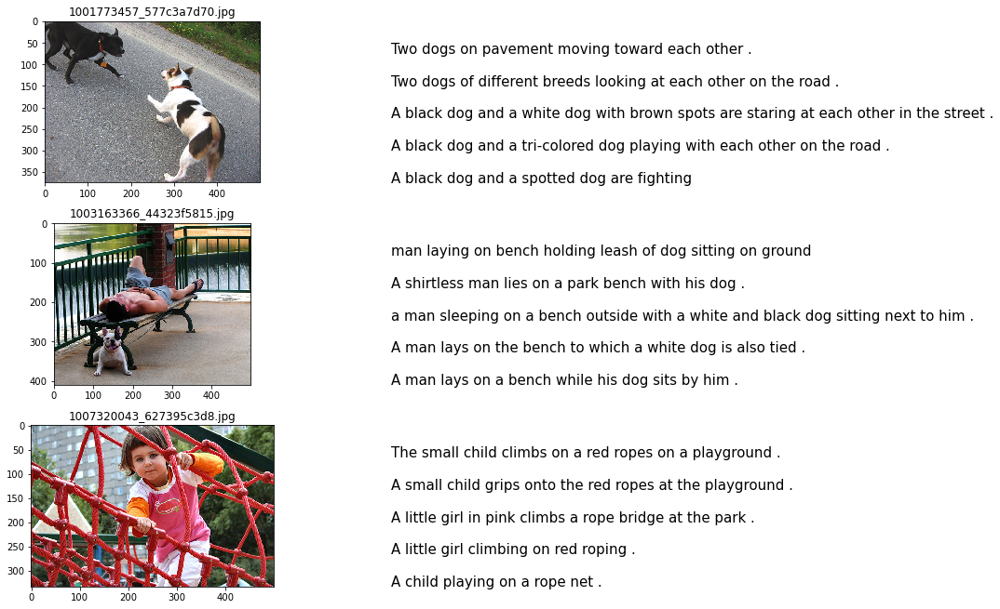

In [80]:
fig = plt.figure(figsize=(16,15))
fig.subplots_adjust(hspace = .10, wspace=2)


for i in range(1, 6, 2):
    
#     plt.axis('off')
    ax = plt.subplot(5,2,i)
    img, name = print_image(i)
    
    ax.imshow(img, cmap=None, interpolation='none')
    ax.set_title(name)
    
    plt.tight_layout() #to make sure that image and caption don't overlap
    
    captions = list(df["Captions"].loc[df.ID==name].values)
    
    ax = plt.subplot(5,2,i+1)
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions)) #to decide the spacing between each line of caption
    
    for j, caption in enumerate(captions):
        ax.text(0, j, caption, fontsize=15)
    plt.axis('off')
    
    

In [11]:
#Create a list which contains all the captions
#add the <start> & <end> token to all those captions as well
annotations = df.Captions.apply(lambda x:'<start> '+ x + ' <end>').to_list()

#Create a list which contains all the path to the images
all_img_path= df.Path.tolist()

print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_img_path)))

Total captions present in the dataset: 40455
Total images present in the dataset: 40455


In [12]:
#Create the vocabulary & the counter for the captions

def get_all_words(list_o_text):
    """
    
    """
    total_vocal = []
    for sentence in list_o_text:
        token_word_with_stopword = sentence.split()
        total_vocal.extend(token_word_with_stopword)
    return total_vocal
    
#calling get_all_words() fucntion here
vocabulary= get_all_words(annotations)

val_count = Counter(vocabulary)
val_count.most_common(40)

[('<start>', 40455),
 ('<end>', 40455),
 ('a', 40271),
 ('.', 34212),
 ('A', 21481),
 ('in', 18961),
 ('the', 15328),
 ('on', 10729),
 ('is', 9345),
 ('and', 8850),
 ('dog', 7982),
 ('with', 7760),
 ('man', 6828),
 ('of', 6712),
 ('Two', 3962),
 ('white', 3875),
 ('black', 3696),
 ('are', 3503),
 ('boy', 3442),
 ('woman', 3227),
 ('girl', 3217),
 (',', 3210),
 ('to', 3173),
 ('wearing', 3061),
 ('The', 2920),
 ('at', 2904),
 ('water', 2774),
 ('red', 2660),
 ('brown', 2475),
 ('people', 2442),
 ('young', 2431),
 ('."', 2365),
 ('his', 2357),
 ('blue', 2257),
 ('dogs', 2082),
 ('running', 2072),
 ('through', 2031),
 ('playing', 2008),
 ('while', 1957),
 ('an', 1944)]

In [13]:
# nltk.download('punkt')

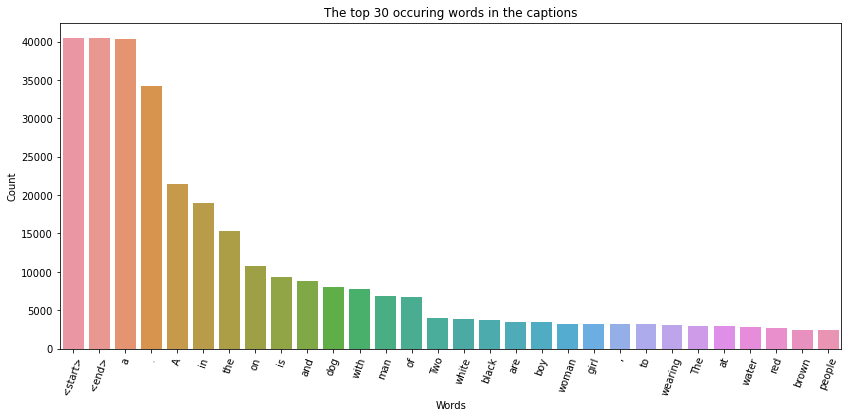

In [14]:
#Visualise the top 30 occuring words in the captions

plt.figure(figsize=(14,6))
most_co_30 = val_count.most_common(30)
x, y = zip(*most_co_30)

sns.barplot(x=np.array(x), y=np.array(y))

plt.xlabel("Words")
plt.ylabel("Count")
plt.title("The top 30 occuring words in the captions")
plt.xticks(rotation=70)
plt.show()

# https://realpython.com/python-counter/

#### As we can see that "a" and "A", "the" and "The" both are incluted and so on 
- So we will lower the case caseu our model dosent required to identify upper and lower case.

In [15]:
vocabulary_lower = list(map(lambda x: x.lower(), vocabulary))


In [16]:
val_count_lower = Counter(vocabulary_lower)
val_count_lower.most_common(50)

[('a', 61752),
 ('<start>', 40455),
 ('<end>', 40455),
 ('.', 34212),
 ('in', 18965),
 ('the', 18249),
 ('on', 10732),
 ('is', 9345),
 ('and', 8851),
 ('dog', 8126),
 ('with', 7761),
 ('man', 7238),
 ('of', 6712),
 ('two', 5224),
 ('white', 3935),
 ('black', 3825),
 ('boy', 3561),
 ('are', 3504),
 ('woman', 3385),
 ('girl', 3320),
 (',', 3210),
 ('to', 3173),
 ('wearing', 3061),
 ('at', 2905),
 ('people', 2856),
 ('water', 2779),
 ('red', 2672),
 ('young', 2607),
 ('brown', 2549),
 ('an', 2399),
 ('."', 2365),
 ('his', 2357),
 ('blue', 2266),
 ('dogs', 2122),
 ('running', 2073),
 ('through', 2031),
 ('playing', 2008),
 ('while', 1957),
 ('down', 1824),
 ('shirt', 1803),
 ('standing', 1786),
 ('ball', 1778),
 ('little', 1754),
 ('grass', 1621),
 ('person', 1536),
 ('child', 1535),
 ('snow', 1489),
 ('jumping', 1470),
 ('over', 1414),
 ('front', 1386)]

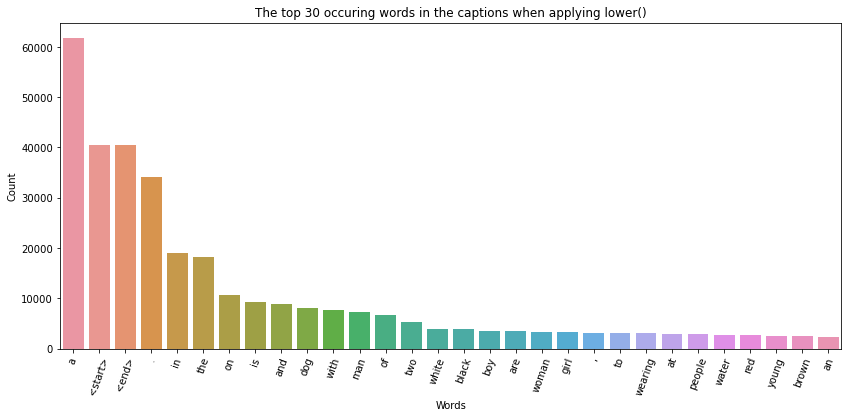

In [17]:
plt.figure(figsize=(14,6))
most_co_30 = val_count_lower.most_common(30)
x, y = zip(*most_co_30)

sns.barplot(x=np.array(x), y=np.array(y))

plt.xlabel("Words")
plt.ylabel("Count")
plt.title("The top 30 occuring words in the captions when applying lower()")
plt.xticks(rotation=70)
plt.show()

### Now all Upper case are gone!

In [18]:

from wordcloud import WordCloud, STOPWORDS

In [19]:
stopwords = set(STOPWORDS)


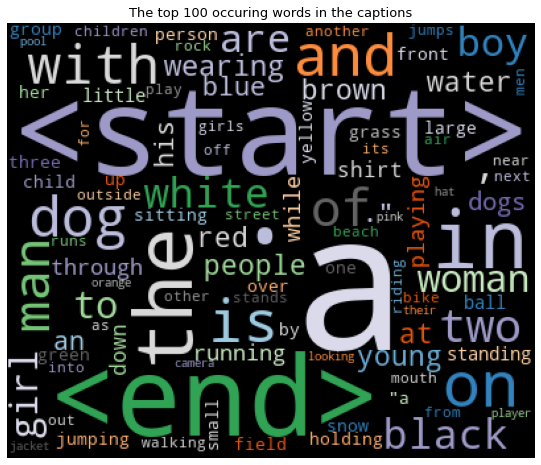

In [20]:

def generate_wordcloud(data, title):
    cloud = WordCloud(width=400,
                      height=330,
                      max_words=100,
                      colormap='tab20c',
                      stopwords=stopwords,
                      collocations=False
                     ).generate_from_frequencies(data)
    plt.figure(figsize=(10,8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.title(title, fontsize=13)
    plt.show()
    
#Use the function to generate the word cloud
generate_wordcloud(val_count_lower, 'The top 100 occuring words in the captions')


# https://towardsdatascience.com/how-to-create-beautiful-word-clouds-in-python-cfcf85141214

- Even when using default Stopwords remover from wordcloud() to remove the stop words didn't work.
- Will try to do it manually.

In [21]:
# removing stopwords and converting dict() to counter()
val_count_lower_no_stopword = Counter({word:count for word, count in val_count_lower.items() if word not in stopwords})


# https://stackoverflow.com/questions/17123568/python-create-counter-object-from-dictionary-include-a-sum-of-values-against-su#:~:text=mycounter%20%3D%20Counter((val%5B0%5D%2C%20val%5B1%5D)%20for%20val%20in%20mydict.values())

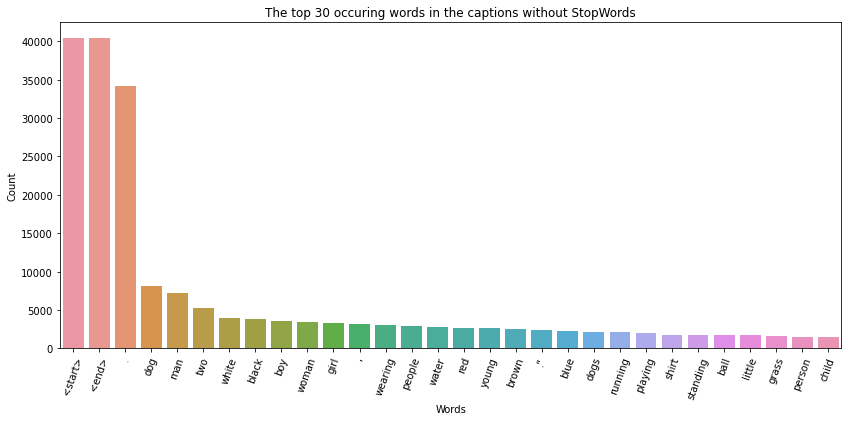

In [22]:
plt.figure(figsize=(14,6))
most_co_30 = val_count_lower_no_stopword.most_common(30)
x, y = zip(*most_co_30)

sns.barplot(x=np.array(x), y=np.array(y))

plt.xlabel("Words")
plt.ylabel("Count")
plt.title("The top 30 occuring words in the captions without StopWords")
plt.xticks(rotation=70)
plt.show()

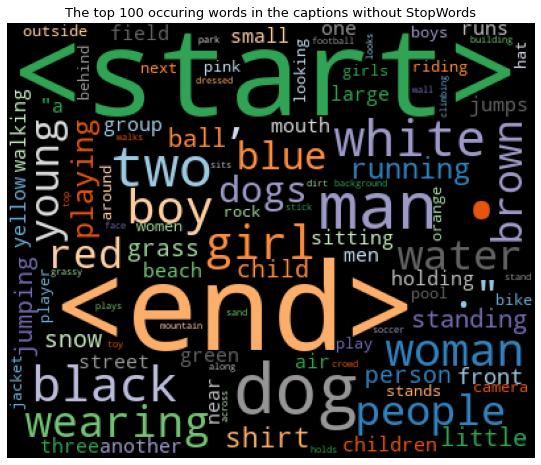

In [23]:
generate_wordcloud(val_count_lower_no_stopword, 'The top 100 occuring words in the captions without StopWords')

********************
********************

## Pre-Processing the captions
1.Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters. 
This gives us a vocabulary of all of the unique words in the data. Keep the total vocaublary to top 5,000 words for saving memory.

2.Replace all other words with the unknown token "UNK" .

3.Create word-to-index and index-to-word mappings.

4.Pad all sequences to be the same length as the longest one.

In [24]:
# create the tokenizer

Max_Vocaublary = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=Max_Vocaublary, 
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+,-./:;=?@[\\]^_`{|}~\t\n')
tokenizer.fit_on_texts(annotations)
train_seqs = tokenizer.texts_to_sequences(annotations) 
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer#:~:text=A%20Numpy%20matrix.-,texts_to_sequences,texts_to_sequences_generator,-View%20source


# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer

In [25]:
for i in range(3):
    print(train_seqs[i:i+1])
    print(annotations[i:i+1], "\n")

[[3, 2, 44, 5, 2, 91, 173, 8, 120, 52, 2, 394, 13, 395, 5, 29, 1, 671, 4]]
['<start> A child in a pink dress is climbing up a set of stairs in an entry way . <end>'] 

[[3, 2, 20, 317, 65, 2, 197, 118, 4]]
['<start> A girl going into a wooden building . <end>'] 

[[3, 2, 41, 20, 120, 65, 2, 197, 2438, 4]]
['<start> A little girl climbing into a wooden playhouse . <end>'] 



In [26]:
# Create word-to-index and index-to-word mappings.
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [27]:
len(tokenizer.word_counts)

8495

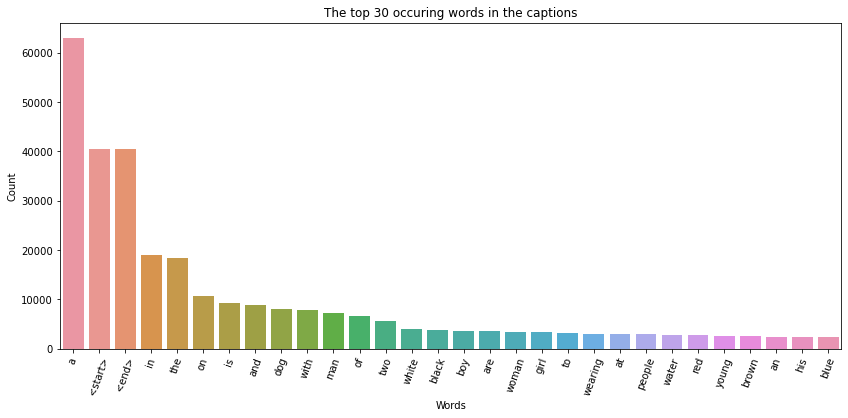

In [28]:
# Create a word count of your tokenizer to visulize the Top 30 occuring words after text processing

plt.figure(figsize=(14,6))
most_co_30 = sorted(tokenizer.word_counts.items(), key=lambda x:x[1], reverse= True)[:30]
x, y = zip(*most_co_30)

sns.barplot(x=np.array(x), y=np.array(y))

plt.xlabel("Words")
plt.ylabel("Count")
plt.title("The top 30 occuring words in the captions")
plt.xticks(rotation=70)
plt.show()

In [29]:
# Pad each vector to the max_length of the captions ^ store it to a vairable

max_seq_length = max(len(i) for i in train_seqs)


cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post', maxlen=max_seq_length)

print("The shape of Caption vector is :" + str(cap_vector.shape))
print(f"Max sequence length: {max_seq_length}")

# https://www.tensorflow.org/api_docs/python/tf/keras/utils/pad_sequences

The shape of Caption vector is :(40455, 39)
Max sequence length: 39


## Pre-processing the images

1.Resize them into the shape of (299, 299)

3.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3. 

### FAQs on how to resize the images::
* Since you have a list which contains all the image path, you need to first convert them to a dataset using <i>tf.data.Dataset.from_tensor_slices</i>. Once you have created a dataset consisting of image paths, you need to apply a function to the dataset which will apply the necessary preprocessing to each image. 
* This function should resize them and also should do the necessary preprocessing that it is in correct format for InceptionV3.


In [30]:
#write your code here to create the dataset consisting of image paths

def preprocess_V3(path):
    """
    
    """
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img
    
print(f"Size of image before preprocessing: {Image.open(all_img_vector[0]).size}")
print(f'Size of image after preprocessing: {preprocess_V3(all_img_vector[0]).shape}')

Size of image before preprocessing: (375, 500)
Size of image after preprocessing: (299, 299, 3)


### Visualizing first 4 images after applying preprocess_V3()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


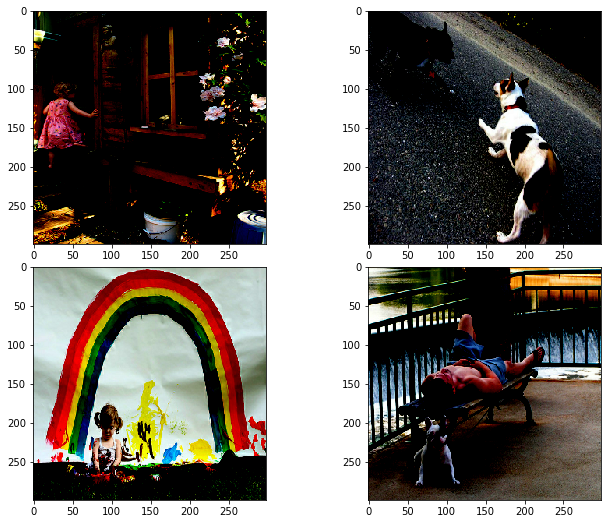

In [31]:
fig, axs = plt.subplots(2,2, figsize=(12, 9), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .1, wspace=.001)

for i, ax in enumerate(axs.ravel()):
    img = preprocess_V3(all_imgs[i])
    ax.imshow(img, cmap=None, interpolation='none')
    
# https://stackoverflow.com/questions/43957776/numpy-ndarray-object-has-no-attribute-imshow#:~:text=fig%2C%20axs%20%3D%20plt.subplots(ncols%3D2%2C%20nrows%3D3%2C%20figsize%3D(8%2C%2010))%0Afor%20i%2C%20ax%20in%20enumerate(axs.ravel())%3A%0A%20%20%20%20ax.imshow(img%5Bi%5D)

In [32]:
#write your code here for creating the function. This function should return images & their path

def load_image(image_path):
    img = preprocess_V3(image_path)
    
    return img, image_path

In [33]:
#write your code here for applying the function to the image path dataset, such that the transformed dataset should contain images & their path

sets_o_img_path = list(set(all_img_vector)) # tf.data.Dataset.from_tensor_slices dosent support sets
print(f"Total image path: {len(sets_o_img_path)}")

image_dataset = tf.data.Dataset.from_tensor_slices(sets_o_img_path) 
# when using AUTOTUNE builds a performance model of the input pipeline and runs an optimization algorithm 
# to find a good allocation of its CPU budget across all. 
# While the input pipeline is running, tf.data tracks the time spent in each operation, 
# so that these times can be fed into the optimization algorithm.
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64,drop_remainder=False)



# https://www.tensorflow.org/api_docs/python/tf/data/Dataset
# https://stackoverflow.com/questions/56613155/tensorflow-tf-data-autotune
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#:~:text=is%20not%20enabled.-,batch,%2C%0A%C2%A0%20%C2%A0%20deterministic%3DNone%2C%0A%C2%A0%20%C2%A0%20name%3DNone%0A),-Combines%20consecutive%20elements
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#:~:text=Dataset.from_tensor_slices(raw_features)-,.map(preprocessing_fn%2C%20num_parallel_calls%3DBATCH_SIZE),-.batch(BATCH_SIZE))%0A%0Aprocessed_features

Total image path: 8091


## Load the pretrained Imagenet weights of Inception net V3

1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

2.The shape of the output of this layer is 8x8x2048. 

3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)



In [34]:
# Loading the InceptionV3 model.
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
# getting the input layer of InceptionV3() model: (None, None, None, 3)
new_input = image_model.input 
# getting the output layer of InceptionV3() model: (None, None, None, 2048)
hidden_layer = image_model.layers[-1].output 

print("Shape of Input:" , new_input.shape)
print("Shape of Output:", hidden_layer.shape)

image_features_extract_model = tf.keras.Model(new_input, hidden_layer) 

Shape of Input: (None, None, None, 3)
Shape of Output: (None, None, None, 2048)


In [35]:
# !pip install pydot
# !pip install pydotplus
# !pip install graphviz
# or
# !conda install graphviz

In [36]:
plot_model(image_features_extract_model, to_file='model.png',show_shapes=True)

In [37]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

- Total params: 21,802,784
- Trainable params: 21,768,352
- **Non-trainable params: 34,432**

In [38]:
# checking Img shape which will be feed to our feature extraction model
for img, image_path in image_dataset:
    print(img.shape)
#     print(img.shape, image_path)
    break

(64, 299, 299, 3)


In [39]:
# write the code to apply the feature_extraction model to your earlier created dataset which contained images & their respective paths
# Once the features are created, you need to reshape them such that feature shape is in order of (batch_size, 8*8, 2048)
# Shape of Output: (None, None, None, 2048)
# img shape (64, 299, 299, 3)
for img, image_path in image_dataset:
    # returns in shape (64, 8, 8, 2048)
    BT64_feature = image_features_extract_model(img)
    # reshaping it into (64, 8*8, 2048)    
    reshaped_BT64 = tf.reshape(tensor=BT64_feature, 
                              shape=(BT64_feature.shape[0], -1, BT64_feature.shape[3]))
    
    for BT64, path64 in zip(reshaped_BT64, image_path):
        path64_np = path64.numpy().decode("utf-8")
        np.save(path64_np, BT64.numpy())

### FAQs on how to store the features:
* You can store the features using a dictionary with the path as the key and values as the feature extracted by the inception net v3 model OR
* You can store using numpy(np.save) to store the resulting vector.

## Dataset creation
1.Apply train_test_split on both image path & captions to create the train & test list. Create the train-test spliit using 80-20 ratio & random state = 42

2.Create a function which maps the image path to their feature. 

3.Create a builder function to create train & test dataset & apply the function created earlier to transform the dataset

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 8*8, 2048)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)


In [41]:
#write your code here

path_train, path_test, cap_train, cap_test = train_test_split(all_img_vector, cap_vector, test_size=0.2, random_state=42)

In [42]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(cap_train)))
print("Testing data for Captions: " + str(len(cap_test)))

Training data for images: 32364
Testing data for images: 8091
Training data for Captions: 32364
Testing data for Captions: 8091


In [43]:
# Create a function which maps the image path to their feature. 
# This function will take the image_path & caption and return it's feature & respective caption.

def map_func(image_path, caption):
    img_tensor = np.load(image_path.decode('utf-8')+'.npy') # write your code here to extract the features from the dictionary stored earlier
    return img_tensor, caption

### FAQs on how to load the features:
* You can load the features using the dictionary created earlier OR
* You can store using numpy(np.load) to load the feature vector.

In [44]:
# create a builder function to create dataset which takes in the image path & captions as input
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier

def gen_dataset(image_path, caption, batch_size = 32, buffer_size=1000):
    """
    This function will gererate a batch of image and caption using AUTOTUNE.
    when using AUTOTUNE builds a performance model of the input pipeline and runs an optimization algorithm 
    to find a good allocation of its CPU budget across all. 
    While the input pipeline is running, tf.data tracks the time spent in each operation, 
    so that these times can be fed into the optimization algorithm.
    """

    dataset = tf.data.Dataset.from_tensor_slices((image_path, caption))

    # Use map to load the numpy files in parallel
    dataset = dataset.map(lambda img_path, cap: 
                          tf.numpy_function(map_func, [img_path, cap], [tf.float32, tf.int32]),
                          num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch
    dataset = dataset.shuffle(buffer_size).batch(batch_size, drop_remainder=False)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    
    return dataset


# https://www.tensorflow.org/api_docs/python/tf/data/Dataset
# https://stackoverflow.com/questions/56613155/tensorflow-tf-data-autotune
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#:~:text=is%20not%20enabled.-,batch,%2C%0A%C2%A0%20%C2%A0%20deterministic%3DNone%2C%0A%C2%A0%20%C2%A0%20name%3DNone%0A),-Combines%20consecutive%20elements
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#:~:text=Dataset.from_tensor_slices(raw_features)-,.map(preprocessing_fn%2C%20num_parallel_calls%3DBATCH_SIZE),-.batch(BATCH_SIZE))%0A%0Aprocessed_features

In [45]:
# creating dataset for train and test with BATCH_SIZE of 32
BATCH_SIZE_dataset = 32
train_dataset = gen_dataset(path_train, cap_train, batch_size = BATCH_SIZE_dataset)
test_dataset = gen_dataset(path_test, cap_test, batch_size = BATCH_SIZE_dataset)

In [46]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size, max_len)

(32, 64, 2048)
(32, 39)


## Model Building
1.Set the parameters

2.Build the Encoder, Attention model & Decoder

In [47]:
BATCH_SIZE = 64 
embedding_dim = 256 
units = 512 
#top 5,000 words +1
vocab_size = 5001 

train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE 

### Encoder

In [48]:
# embed_dim=256

class Encoder(tf.keras.Model):
    def __init__(self, embed_dim=256):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) # build your Dense layer 
        
    def call(self, features):
        features =  self.dense(features)   # extract the features from the image shape: (batch, 8*8, embed_dim)
        # relu range from 0 or x 
        features = tf.nn.relu(features)    # build your Dense layer with relu activation
        return features

### Attention model

In [49]:
class Attention_model(tf.keras.Model): 
    """
    BATCH_SIZE = 64 
    embedding_dim = 256 
    units = 512 
    vocab_size = 5001 
    """
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)    #build your Dense layer
        self.W2 = tf.keras.layers.Dense(units)    #build your Dense layer
        self.V  = tf.keras.layers.Dense(1)        #build your final Dense layer with unit 1
        self.units = units

    def call(self, features, hidden):
        #features shape: (batch_size, 8*8, embedding_dim) (32, 64, 256)
        # hidden shape: (batch_size, hidden_size) (32, 512) [batch, unit]
        
        hidden_with_time_axis = tf.expand_dims(hidden, 1)     # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        
        # attention_hidden_layer shape == (batch_size, 64, units)
        # tanh() range from -1 to 1
        attention_hidden_layer = (tf.nn.tanh(
                                        self.W1(features) +
                                        self.W2(hidden_with_time_axis)
                                            ))
        # passing attention_hidden_layer to self.V to get scalar value
        score = self.V(attention_hidden_layer)                 # build your score funciton to shape: (batch_size, 8*8, units)
        
        # passing the score to Softmax() to get value in the range of 0 to 1 
        # cause when we add up score values it won't sum up to 1, so applying softmax will help solve it. [xi/sum(xi)]
        # Why we are doing it is becacuse you can get how important is the "j"th pixel of the input image 
        # at the "t"th time stamp.
        attention_weights = tf.nn.softmax(score, axis=1)       # extract your attention weights with shape: (batch_size, 8*8, 1)
        
        # attention weights (the probability distribution) of all the pixel values in the feature vector.
        # now i need to take a weighted sum of the attention weights on my feature MAP
        # shape: create the context vector with shape (batch_size, 8*8, embedding_dim)
        context_vector = attention_weights * features
        
        # By doing tf.reduce_sum(x, 1) the tensor is reduced along the second dimension (columns), 
        # so the result is [1, 1] + [1, 1] + [1, 1] = [3, 3].
        # reduce the shape to (batch_size, embedding_dim) # here column is gone
        context_vector = tf.reduce_sum(context_vector, axis=1) 
        
        return context_vector, attention_weights

### Decoder

In [50]:
class Decoder(tf.keras.Model):
    """
    BATCH_SIZE = 64 
    embedding_dim = 256 
    units = 512 
    vocab_size = 5001 
    """
    
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        
        self.units = units # units = 512 
        self.attention = Attention_model(self.units) # iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) # build your Embedding layer
        
        self.gru = tf.keras.layers.GRU(self.units, #units = 512 
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        
        self.d1 = tf.keras.layers.Dense(self.units)# build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size)# build your Dense layer


    def call(self, x, features, hidden):
        
        # create your context vector & attention weights from attention model
        context_vector, attention_weights = self.attention(features, hidden)
        
        # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = self.embed(x) 
        # embed (32, 1, 256)
#         print("embed", embed.shape)
        
        # Concatenate your input with the context vector from attention layer. 
        # HERE we have to concanate context_vector+embed 
        # but we have to make it in same shape
        # Shape: (batch_size, 1, embedding_dim + embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)
        # embed (32, 1, 512)
#         print("embed",embed.shape) 
        
        # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output, state = self.gru(embed)
        # output (32, 1, 512)  
        # state (32, 512)
        
        output = self.d1(output)
        # output (32, 1, 512) (batch_size, 1, hidden_size)
        
        output = tf.reshape(output, (-1, output.shape[2]))   # shape : (batch_size * max_length, hidden_size)
        # output (32, 512) (batch_size, 1, hidden_size)
        
        output = self.d2(output)                             # shape : (batch_size * max_length, vocab_size)
        # output (32, 5001)
        
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [51]:
# embedding_dim = 256,
encoder = Encoder(embed_dim=embedding_dim)

In [52]:
# BATCH_SIZE = 64, embedding_dim = 256, units = 512, vocab_size = 5001 
decoder = Decoder(embedding_dim, units, vocab_size)

### initializing  features, hidden and dec_input(x)

In [53]:
# getting FEATUREs from the encoder model
features = encoder(sample_img_batch)

# getting HIDDEN from the decoder model
# here initial state is ""tf.zeros""  [batch, unit]
hidden = decoder.init_state(batch_size=BATCH_SIZE_dataset) # BATCH_SIZE_dataset=32

# here tokenizer.word_index['<start>'] is 3 as it is its index
# and [3]*32 will give [3,3....3] {len=32}
# expend_dim().shape = [32,1]
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE_dataset, 1) 

In [54]:
print("features: ", features.shape, "[batch, 8*8, embd]", 
      "\nhidden: ", hidden.shape, "[batch, unit]",
      "\ndec_input: ", dec_input.shape, "[batch, 1]")

features:  (32, 64, 256) [batch, 8*8, embd] 
hidden:  (32, 512) [batch, unit] 
dec_input:  (32, 1) [batch, 1]


### Testing the model with one batch

In [55]:
predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)

print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch, vocab_size)
print('hidden_out shape from Decoder: {}'.format(hidden_out.shape)) #(batch, hidden_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim) 

Predcitions shape from Decoder: (32, 5001)
hidden_out shape from Decoder: (32, 512)
Attention weights shape from Decoder: (32, 64, 1)


## Model training & optimization
1.Set the optimizer & loss object

2.Create your checkpoint path

3.Create your training & testing step functions

4.Create your loss function for the test dataset

In [56]:
#define the optimizer
optimizer = tf.keras.optimizers.Adam()
#define your loss object
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [57]:
def loss_function(traget, pred):
    # any value with 0 to keep False and rest as True
    mask = tf.math.logical_not(tf.math.equal(traget, 0))
    # using SparseCategoricalCrossentropy() to get loss 
    loss_ = loss_object(traget, pred)
    
    # Casting a tensor to a new type.
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ = loss_ * mask
    
    # Computes the mean of elements across dimensions of a tensor. Same as np.mean()
    return tf.reduce_mean(loss_)

In [58]:
checkpoint_path = "./checkpoint/train"

ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [59]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

### Teacher forcing:
* While creating the training step for your model, you will apply Teacher forcing.
* Teacher forcing is a technique where the target/real word is passed as the next input to the decoder instead of previous prediciton.
- Training with Teacher Forcing converges faster. 
- At the early stages of training, the predictions of the model are very bad. If we do not use Teacher Forcing, the hidden states of the model will be updated by a sequence of wrong predictions, errors will accumulate, and it is difficult for the model to learn from that.

In [60]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    # hidden:  (32, 512) [batch, unit] 
    hidden = decoder.init_state(batch_size=target.shape[0]) # batch_size=32
    
    # dec_input:  (32, 1) [batch, 1]
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    # is used to computes the gradient using operations recorded in context of this tape.
    with tf.GradientTape() as tape:
        # getting the feature from encoder model
        features = encoder(img_tensor)
        
        for i in range(1, target.shape[1]): # target shape:(32, 39)
            # running decoder() to give "predicted word" and hidden;
            # where "hidden" is used again for Attention_model(features, hidden).
            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
            
            # predictions shape:(32, 5001)
            loss += loss_function(target[:,i], predictions)
            
            # using teacher forcing, 
            # where we will feed the ground truth insteed of its prediction to its GRU model
            dec_input = tf.expand_dims(target[:, i], 1)
        
    #CAlculating the average loss
    avg_loss = (loss / int(target.shape[1])) # target shape:(32, 39)
    # getting total trainable_variables 
    total_trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    # to calculate gradients with respect to every trainable variable
    gradients = tape.gradient(loss, total_trainable_variables)

    # compute gradients and apply it to the optimizer and backpropagate.
    optimizer.apply_gradients(zip(gradients, total_trainable_variables))

    return loss, avg_loss

# SOURCE:
# TEACHER FORCING
# https://towardsdatascience.com/what-is-teacher-forcing-3da6217fed1c#:~:text=Without%20Teacher%20Forcing,the%202nd%20prediction.

* While creating the test step for your model, you will pass your previous prediciton as the next input to the decoder.

In [61]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        # getting the feature from encoder model
        features = encoder(img_tensor)
        
        for i in range(1, target.shape[1]):# target shape:(32, 39)
            # running decoder() to give "predicted word" and hidden;
            # where "hidden" is used again for Attention_model(features, hidden).
            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
            
            loss += loss_function(target[:,i], predictions)
            
            # using teacher forcing, 
            # where we will feed the ground truth insteed of its prediction to its GRU model
            dec_input = tf.expand_dims(target[:, i], 1)
        
    #CAlculating the average loss
    avg_loss = (loss / int(target.shape[1])) # target shape:(32, 39)
    # getting total trainable_variables 
    total_trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    # to calculate gradients with respect to every trainable variable
    gradients = tape.gradient(loss, total_trainable_variables)

    # compute gradients and apply it to the optimizer and backpropagate.
    optimizer.apply_gradients(zip(gradients, total_trainable_variables))
    
    return loss, avg_loss

# SOURCE:
# TEACHER FORCING
# https://towardsdatascience.com/what-is-teacher-forcing-3da6217fed1c#:~:text=Without%20Teacher%20Forcing,the%202nd%20prediction.
# https://www.tensorflow.org/api_docs/python/tf/math/argmax#:~:text=tf.math.argmax(B%2C%200)%0A%3Ctf.Tensor%3A%20shape%3D(5%2C)%2C%20dtype%3Dint64%2C%20numpy%3Darray(%5B2%2C%202%2C%200%2C%202%2C%202%5D)%3E%0Atf.math.argmax(B%2C%201)%0A%3Ctf.Tensor%3A%20shape%3D(3%2C)%2C%20dtype%3Dint64%2C%20numpy%3Darray(%5B2%2C%202%2C%201%5D)%3E

In [62]:
def test_loss_cal(test_dataset):
    """
    Calculating test loss and return the average test loss
    """
    total_loss = 0
    
    for (batch, (img_tensor,target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss += t_loss
        avg_test_loss = total_loss/test_num_steps
    return avg_test_loss

### Running the model here

In [63]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss = 100

train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE 

for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        # sending one batch of image at the time 
        # batch:0-32, img_tensor:(32, 64, 2048), target:(32, 39)
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss = total_loss/train_num_steps # train_num_steps=len(path_train)//BATCH_SIZE 
        
    loss_plot.append(avg_train_loss)    
    
    # Running test 
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1, avg_train_loss, test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|                                                                                           | 0/30 [00:00<?, ?it/s]

For epoch: 1, the train loss is 2.371, & test loss is 2.010
Time taken for 1 epoch 492.3950912952423 sec

Test loss has been reduced from 100.000 to 2.010


  3%|██▋                                                                             | 1/30 [08:12<3:58:11, 492.81s/it]

For epoch: 2, the train loss is 1.869, & test loss is 1.787
Time taken for 1 epoch 282.6276767253876 sec

Test loss has been reduced from 2.010 to 1.787


  7%|█████▎                                                                          | 2/30 [12:55<2:52:23, 369.41s/it]

For epoch: 3, the train loss is 1.703, & test loss is 1.649
Time taken for 1 epoch 298.3579978942871 sec

Test loss has been reduced from 1.787 to 1.649


 10%|████████                                                                        | 3/30 [17:55<2:31:48, 337.36s/it]

For epoch: 4, the train loss is 1.583, & test loss is 1.540
Time taken for 1 epoch 289.44827938079834 sec

Test loss has been reduced from 1.649 to 1.540


 13%|██████████▋                                                                     | 4/30 [22:46<2:18:16, 319.08s/it]

For epoch: 5, the train loss is 1.484, & test loss is 1.447
Time taken for 1 epoch 292.9803886413574 sec

Test loss has been reduced from 1.540 to 1.447


 17%|█████████████▎                                                                  | 5/30 [27:40<2:09:18, 310.33s/it]

For epoch: 6, the train loss is 1.396, & test loss is 1.365
Time taken for 1 epoch 291.8860650062561 sec

Test loss has been reduced from 1.447 to 1.365


 20%|████████████████                                                                | 6/30 [32:38<2:02:23, 306.00s/it]

For epoch: 7, the train loss is 1.317, & test loss is 1.291
Time taken for 1 epoch 290.2687373161316 sec

Test loss has been reduced from 1.365 to 1.291


 23%|██████████████████▋                                                             | 7/30 [37:29<1:55:26, 301.15s/it]

For epoch: 8, the train loss is 1.254, & test loss is 1.221
Time taken for 1 epoch 293.2259244918823 sec

Test loss has been reduced from 1.291 to 1.221


 27%|█████████████████████▎                                                          | 8/30 [42:29<1:50:18, 300.83s/it]

For epoch: 9, the train loss is 1.182, & test loss is 1.157
Time taken for 1 epoch 294.5556409358978 sec

Test loss has been reduced from 1.221 to 1.157


 30%|████████████████████████                                                        | 9/30 [47:29<1:45:07, 300.35s/it]

For epoch: 10, the train loss is 1.121, & test loss is 1.100
Time taken for 1 epoch 292.195458650589 sec

Test loss has been reduced from 1.157 to 1.100


 33%|██████████████████████████▎                                                    | 10/30 [52:23<1:39:27, 298.35s/it]

For epoch: 11, the train loss is 1.066, & test loss is 1.048
Time taken for 1 epoch 296.26853823661804 sec

Test loss has been reduced from 1.100 to 1.048


 37%|████████████████████████████▉                                                  | 11/30 [57:21<1:34:27, 298.27s/it]

For epoch: 12, the train loss is 1.018, & test loss is 1.001
Time taken for 1 epoch 294.6401183605194 sec

Test loss has been reduced from 1.048 to 1.001


 40%|██████████████████████████████▊                                              | 12/30 [1:02:17<1:29:20, 297.79s/it]

For epoch: 13, the train loss is 0.970, & test loss is 0.954
Time taken for 1 epoch 299.2793023586273 sec

Test loss has been reduced from 1.001 to 0.954


 43%|█████████████████████████████████▎                                           | 13/30 [1:07:22<1:24:57, 299.83s/it]

For epoch: 14, the train loss is 0.930, & test loss is 0.914
Time taken for 1 epoch 295.55437994003296 sec

Test loss has been reduced from 0.954 to 0.914


 47%|███████████████████████████████████▉                                         | 14/30 [1:12:22<1:20:00, 300.03s/it]

For epoch: 15, the train loss is 0.892, & test loss is 0.876
Time taken for 1 epoch 297.2801766395569 sec

Test loss has been reduced from 0.914 to 0.876


 50%|██████████████████████████████████████▌                                      | 15/30 [1:17:31<1:15:39, 302.63s/it]

For epoch: 16, the train loss is 0.856, & test loss is 0.841
Time taken for 1 epoch 296.1736476421356 sec

Test loss has been reduced from 0.876 to 0.841


 53%|█████████████████████████████████████████                                    | 16/30 [1:22:34<1:10:40, 302.90s/it]

For epoch: 17, the train loss is 0.828, & test loss is 0.814
Time taken for 1 epoch 290.4806914329529 sec

Test loss has been reduced from 0.841 to 0.814


 57%|███████████████████████████████████████████▋                                 | 17/30 [1:27:34<1:05:23, 301.81s/it]

For epoch: 18, the train loss is 0.795, & test loss is 0.787
Time taken for 1 epoch 288.90283131599426 sec

Test loss has been reduced from 0.814 to 0.787


 60%|██████████████████████████████████████████████▏                              | 18/30 [1:32:41<1:00:42, 303.52s/it]

For epoch: 19, the train loss is 0.768, & test loss is 0.758
Time taken for 1 epoch 287.6753947734833 sec

Test loss has been reduced from 0.787 to 0.758


 63%|██████████████████████████████████████████████████                             | 19/30 [1:37:29<54:47, 298.88s/it]

For epoch: 20, the train loss is 0.746, & test loss is 0.731
Time taken for 1 epoch 287.9467806816101 sec

Test loss has been reduced from 0.758 to 0.731


 67%|████████████████████████████████████████████████████▋                          | 20/30 [1:42:18<49:17, 295.72s/it]

For epoch: 21, the train loss is 0.725, & test loss is 0.721
Time taken for 1 epoch 287.90703558921814 sec

Test loss has been reduced from 0.731 to 0.721


 70%|███████████████████████████████████████████████████████▎                       | 21/30 [1:47:06<44:01, 293.48s/it]

For epoch: 22, the train loss is 0.705, & test loss is 0.697
Time taken for 1 epoch 290.43533635139465 sec

Test loss has been reduced from 0.721 to 0.697


 73%|█████████████████████████████████████████████████████████▉                     | 22/30 [1:51:58<39:05, 293.15s/it]

For epoch: 23, the train loss is 0.685, & test loss is 0.677
Time taken for 1 epoch 291.2229599952698 sec

Test loss has been reduced from 0.697 to 0.677


 77%|████████████████████████████████████████████████████████████▌                  | 23/30 [1:56:53<34:14, 293.51s/it]

For epoch: 24, the train loss is 0.668, & test loss is 0.661
Time taken for 1 epoch 291.0568583011627 sec

Test loss has been reduced from 0.677 to 0.661


 80%|███████████████████████████████████████████████████████████████▏               | 24/30 [2:01:48<29:24, 294.09s/it]

For epoch: 25, the train loss is 0.654, & test loss is 0.648
Time taken for 1 epoch 290.73006677627563 sec

Test loss has been reduced from 0.661 to 0.648


 83%|█████████████████████████████████████████████████████████████████▊             | 25/30 [2:06:40<24:26, 293.36s/it]

For epoch: 26, the train loss is 0.639, & test loss is 0.629
Time taken for 1 epoch 292.2637691497803 sec

Test loss has been reduced from 0.648 to 0.629


 87%|████████████████████████████████████████████████████████████████████▍          | 26/30 [2:11:33<19:33, 293.35s/it]

For epoch: 27, the train loss is 0.628, & test loss is 0.615
Time taken for 1 epoch 290.2389132976532 sec

Test loss has been reduced from 0.629 to 0.615


 90%|███████████████████████████████████████████████████████████████████████        | 27/30 [2:16:26<14:39, 293.11s/it]

For epoch: 28, the train loss is 0.614, & test loss is 0.603
Time taken for 1 epoch 289.92809653282166 sec

Test loss has been reduced from 0.615 to 0.603


 93%|█████████████████████████████████████████████████████████████████████████▋     | 28/30 [2:21:17<09:45, 292.66s/it]

For epoch: 29, the train loss is 0.604, & test loss is 0.597
Time taken for 1 epoch 288.8858723640442 sec

Test loss has been reduced from 0.603 to 0.597


 97%|████████████████████████████████████████████████████████████████████████████▎  | 29/30 [2:26:08<04:52, 292.04s/it]

For epoch: 30, the train loss is 0.592, & test loss is 0.587
Time taken for 1 epoch 289.87348437309265 sec

Test loss has been reduced from 0.597 to 0.587


100%|███████████████████████████████████████████████████████████████████████████████| 30/30 [2:31:01<00:00, 302.05s/it]


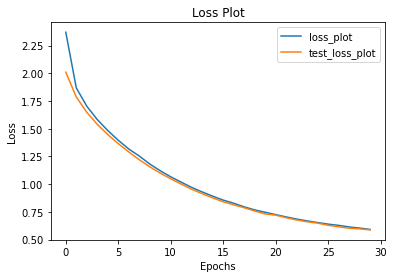

In [64]:
plt.plot(loss_plot, label ='loss_plot')
plt.plot(test_loss_plot, label ='test_loss_plot')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.legend()
plt.show()

#### NOTE: 
* Since there is a difference between the train & test steps ( Presence of teacher forcing), you may observe that the train loss is decreasing while your test loss is not. 
* This doesn't mean that the model is overfitting, as we can't compare the train & test results here, as both approach is different.
* Also, if you want to achieve better results you can run it more epochs, but the intent of this capstone is to give you an idea on how to integrate attention mechanism with E-D architecture for images. 
#### The intent is not to create the state of art model. 

## Model Evaluation
1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

### Evaluate using Beam Search
- The BLEU score is used as an evaluation metric for the predicted word. It determines the "difference" between the predicted sentence from the human-created sentence.

- Here we are using Bleu Score to get score between all the reference caption w.r.t prediction caption.
- Also, we are checking Bleu Score using all Individual caption w.r.t prediction caption.
- we are prints BLEU SCORE for "custom weight", " 1-Gram", " 2-Gram", " 3-Gram", " 4-Gram".

In [104]:
# Here we are using 64 cause when we Extract features we get shape (1, 8, 8, 2048) pre image, 
# and we need to reshape to (1, 8*8, 2048); so 8*8=64
attention_features_shape = 64
max_sequence_len = max_seq_length # 39

In [108]:
def evaluate(image):
    
    # this will help to plot how attention model FOCUS on IMAGE.
    # attention_plot shape: (39,64)
    attention_plot = np.zeros((max_sequence_len, attention_features_shape))

    hidden = decoder.init_state(batch_size=1)
    # load_img will convert the image to (299, 299, 3) 
    # but tf will accept image in form of (batch, w,h, channel) so adding 1 to index 0 = (1,299,299,3)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    
    
    # Extract features using our feature extraction model which is Inception V3
    # returns in shape (1, 8, 8, 2048)
    img_tensor_val = image_features_extract_model(temp_input)
    
    # reshaping it into (1, 8*8, 2048)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    
    # extract the features ussing encoder model.
    features = encoder(img_tensor_val)
    
    # here tokenizer.word_index['<start>'] is 3 as it is its index
    # final shape: (1,1) [batch, word]
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_sequence_len):  # 39
        # running decoder() to give "predicted word" and hidden;
        # where "hidden" is used again for Attention_model(features, hidden).
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        
        # (batch, 8*8, embed_dim) (1, 64, 1) => new shape: (64,)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        
        # extract the predicted id(embedded value) which carries the max value
        # predictions shape: (1, 5001)
        # tf.random.categorical ==> searching max value and returns its index
        # this is same like using np.argmax() => predictions.numpy().argmax()
        predicted_id = predictions.numpy()[0].argmax()
#         predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        
        # getting the predicted word using the tokenizer
        result.append(tokenizer.index_word[predicted_id])
        # map the id to the word from tokenizer and append the value to the result list
        
        # if the predicted word is <end> then signalling the end of the caption.
        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot
        
        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    
    return result, attention_plot


#### Visualize the attention while Caption Generation 

In [166]:
# default
from PIL import Image
def plot_attmap(caption, weights, image):
    
    len_cap = len(caption)
    sub_col = 4 # let keep column as default 4 and remaining can be ROW
    sub_row = len_cap//sub_col + 1  # this will be rows ie:17//4 = 4+1 = 5
    
    # we need fix column but we can change number of rows and each row carries 4 inch
    fig = plt.figure(figsize=(20, 4*sub_row)) # figsize=(width, height) 
    temp_img = np.array(Image.open(image))
    
    
    
    for cap in range(len_cap): 
        weights_img = np.reshape(weights[cap], (8,8))
        weights_img = np.array(Image.fromarray(weights_img).resize((224, 224), Image.LANCZOS))
        
        ax = fig.add_subplot(sub_row, sub_col, cap+1)
        ax.set_title(caption[cap], fontsize=15)
        
        img=ax.imshow(temp_img)
        
        ax.imshow(weights_img, cmap='gist_heat', alpha=0.6,extent=img.get_extent())
        ax.axis('off')
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()

In [96]:
from nltk.translate.bleu_score import sentence_bleu

In [97]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [91]:
def print_img_captions(indx):
    
    img_path = path_test[indx]
    ID_name = img_path[len(images)+1:]
    captions = list(df["Captions"].loc[df.ID==ID_name].values)

    fig = plt.figure(figsize=(10,3))
    fig.subplots_adjust(hspace = .10, wspace=2)

    ax = plt.subplot(1,2,1)
    img = io.imread(img_path)

    ax.imshow(img, cmap=None, interpolation='none')
    ax.set_title(ID_name)

    plt.tight_layout() #to make sure that image and caption don't overlap

    ax = plt.subplot(1,2,2)
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions)) #to decide the spacing between each line of caption

    for j, caption in enumerate(captions):
        ax.text(0, j,  caption, fontsize=15)

    ax.text(0, j+1, "All 5 Real Captions:", fontsize=25)
    plt.axis('off')
    
    return captions, img_path




In [178]:
# To customize the prints
start = "\033[1m"
end = "\033[0;0m"
weights=[(0.25,0.25,0.25,0.25), (1,0,0,0), (0,1,0,0), (0,0,1,0), (0,0,0,1)]
name_o_score = ["", " 1-Gram", " 2-Gram", " 3-Gram", " 4-Gram", ]

# source:
# https://machinelearningmastery.com/calculate-bleu-score-for-text-python/  # for n-grams

In [175]:
def All_wrt_predict_bleu_scr(captions, predict):
    """
    This is used for plotting Bleu Score using all the reference caption w.r.t prediction caption.
    This prints BLEU SCORE for "custom weight", " 1-Gram", " 2-Gram", " 3-Gram", " 4-Gram".
    """
    
    all_cap_BleuS_weight = {}
    for weight in weights:
        B_score = sentence_bleu([captions[0].split(), 
                                 captions[1].split(), 
                                 captions[2].split(), 
                                 captions[3].split(), 
                                 captions[4].split()], 
                                predict.split(),  
                                weights=weight)
        
        all_cap_BleuS_weight[weight] = round(B_score*100, 2)

#     all_cap_BleuS_weight
    
    
    fig = plt.figure(figsize=(10,5))
    fig.subplots_adjust(hspace = .10, wspace=2)
    ax = plt.subplot(1, 1, 1)
    
    score_idx = len(all_cap_BleuS_weight)+3
    ax.set_xlim(0, 1)
    ax.set_ylim(0, score_idx) # as we only need 8 lines 

    
    ax.text(0, score_idx-1, "Bleu Score for All Caption w.r.t Prediction ", fontsize=25)
    ax.text(0, score_idx-2, "ie: sentence_bleu([cap[0], cap[1], cap[2], cap[3], cap[4]], predict,  weights=weight)", fontsize=20)    
    ax.text(0, score_idx-3, "BELU Score:", fontsize=25)
    score_idx -= 4

    for j, (k,v) in enumerate(all_cap_BleuS_weight.items()):
        ax.text(0, score_idx, name_o_score[j]+" Weight"+str(k)+": "+str(v), fontsize=15)
        score_idx -= 1

    plt.axis('off')

# Source:
# https://www.nltk.org/api/nltk.translate.bleu_score.html#:~:text=sentence_bleu(%5Breference1%2C%20reference2%2C%20reference3%5D%2C%20hypothesis1)
# https://machinelearningmastery.com/calculate-bleu-score-for-text-python/ # for n-grams
# https://stackoverflow.com/questions/40542523/nltk-corpus-level-bleu-vs-sentence-level-bleu-score

In [149]:
def Individual_caption_bleu_score(captions, predict):
    """
    This is used for plotting Bleu Score using all Individual caption w.r.t prediction caption.
    This prints BLEU SCORE for "custom weight", " 1-Gram", " 2-Gram", " 3-Gram", " 4-Gram" for all the captions.
    """

    #  individual caption Bleu Score:
    captions_Bleu_score_dict = {} 
    # weight_Bleu_score_dict = {}
    for caption in (captions):
        weight_Bleu_score_dict = {}
        for weight in weights:
            B_score = sentence_bleu([caption.split()], predict.split(),  weights=weight)
            weight_Bleu_score_dict[weight] = round(B_score*100, 2)
        captions_Bleu_score_dict[caption] = weight_Bleu_score_dict
        
    fig = plt.figure(figsize=(1,0.1))
    fig.subplots_adjust(hspace = .10, wspace=2)
    ax = plt.subplot(1, 1, 1)

    score_idx = 1
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1) # as we only 1
    ax.text(0, 2, "Individual Caption VS Prediction Caption and Bleu Score", fontsize=30)
    plt.axis('off')
    
    position_caption = ["First", "Second", "Third", "Forth", "Fifth"]

    fig = plt.figure(figsize=(13,14))
    fig.subplots_adjust(hspace = .10, wspace=2)

    all_keys_caption = list(captions_Bleu_score_dict.keys())
    caption_idx = 0
    for i in range(1, 10, 2):

    #     plt.axis('off')
        ax = plt.subplot(6,2,i)

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 4)  
        
        # for left SIDE plot (FOR CAPTIONS)
        ax.text(0, 4, position_caption[int(i/2)] + " Real Caption: ", fontsize=20)
        ax.text(0, 3, all_keys_caption[caption_idx], fontsize=15)    
        ax.text(0, 2, "Prediction Caption:", fontsize=20)
        ax.text(0, 1, predict, fontsize=15)

        plt.axis('off')

        All_Bleu_score = captions_Bleu_score_dict[all_keys_caption[caption_idx]]
        caption_idx += 1
        
        # for RIGHT SIDE plot (BLEU SCORE)
        ax = plt.subplot(6,2,i+1)
        ax.set_xlim(0,1)
        ax.set_ylim(0,len(All_Bleu_score)) #to decide the spacing between each line of Bleu Scores

        score_idx = len(All_Bleu_score)+1
        ax.text(0, score_idx, "BELU Score:", fontsize=25)
        score_idx -= 1

        for j, (k,v) in enumerate(All_Bleu_score.items()):
            ax.text(0, score_idx, name_o_score[j]+" Weight"+str(k)+": "+str(v), fontsize=15)
            score_idx -= 1
        plt.axis('off')

    plt.tight_layout() 
    


In [143]:
def plot_header(text):
    """
    For plotting headers
    """
    lis_text = text.split()
    len_text = len(lis_text)
    count_text_len = 0
    max_len = 11
        
    indx_count = (len_text//max_len)+1 # 27//11 +1 = 2+1=3
    
    fig = plt.figure(figsize=(1, indx_count/2.1))
    ax = plt.subplot(1, 1, 1)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, indx_count) # as we only 1
    
    
    while (count_text_len+max_len < len_text):
        plt_text = ' '.join(lis_text[count_text_len:count_text_len+max_len])
        ax.text(0, indx_count, plt_text , fontsize=30)
        indx_count -= 1
        count_text_len += max_len
        
    plt_text = ' '.join(lis_text[count_text_len:len_text])
    ax.text(0, indx_count, plt_text , fontsize=30)
        
#     ax.text(0, 2, text, fontsize=30)
    plt.axis('off')
    plt.show()
    

In [176]:
def test_caption_generation(img_test, ran_no=0):
    """
    This function is used for predicting UNSEEN IMAGE (path_test) and generate a caption.
    we use Bleu Score to see how good the predicted caption is W.R.T its real caption.
    BUT The real caption is not shown when predicting the caption... 
    Real caption is only used to check BLEU SCORE... 
    
    WHICH BASICALLY MEANS NO TRACHER FORCING IS APPLIED ON TEST IMAGE!!
    """

    
    random_ID = np.random.randint(ran_no, len(img_test))
    
    # 1: PRINTING ITS ORIGINAL IMAGE AND ALL 5 CAPTION OF THAT IMAGE.
    # IT returns all 5 caption; which is used for checking BLEU SCORE And test image path to generate caption for it.
    All_5_captions, test_image_path = print_img_captions(random_ID)
    plt.show()

    # getting pedicted CAPTION 
    # and Attention_plot to check where attention model had focused to predict those CAPTION TEXT
    pred_text, attention_plot = evaluate(test_image_path)
    
    
    # 2
    pred_caption = ' '.join(pred_text).rsplit(' ', 1)[0]
    
    header1 = 'Prediction Caption: '+pred_caption
    plot_header(header1) # ploting a header text
      
    print (start+'Prediction Caption: '+end, pred_caption)
    
    # 3: its used for convering text to audio and Display it on notebook
    speech = gTTS(""+ pred_caption, lang = 'en', slow = False) 
    audio_file = 'voice.mp3'
    speech.save(audio_file)
    #playsound('voice.wav')
    print("\n\n"+start+'PLAY THE AUDIO: '+end)
    display.display(display.Audio(audio_file, rate=None, autoplay=False))

    
    # 4: This is used for plotting Bleu Score using all 5 reference caption w.r.t prediction caption.
    All_wrt_predict_bleu_scr(All_5_captions, pred_caption)
    
    # 5: This is used for plotting Bleu Score using all Individual caption w.r.t prediction caption.
    Individual_caption_bleu_score(All_5_captions, pred_caption)
    plt.show()
    
    header2 = 'Visualize the attention while Caption is Generated'
    plot_header(header2) # ploting a header text
    
    #6: This is used for Visualize the attention while Caption is Generated
    plot_attmap(pred_text, attention_plot, test_image_path)

    
# Source:
# https://www.nltk.org/api/nltk.translate.bleu_score.html#:~:text=sentence_bleu(%5Breference1%2C%20reference2%2C%20reference3%5D%2C%20hypothesis1)
# https://machinelearningmastery.com/calculate-bleu-score-for-text-python/ # for n-grams
# https://stackoverflow.com/questions/40542523/nltk-corpus-level-bleu-vs-sentence-level-bleu-score

## Testing with One Random Image

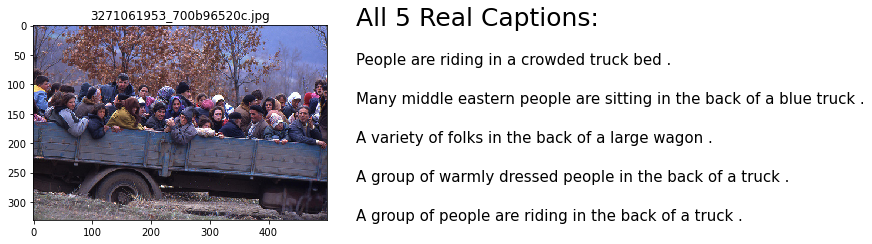

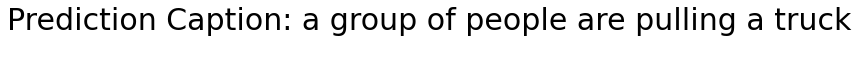

Prediction Caption:  a group of people are pulling a truck


PLAY THE AUDIO: 


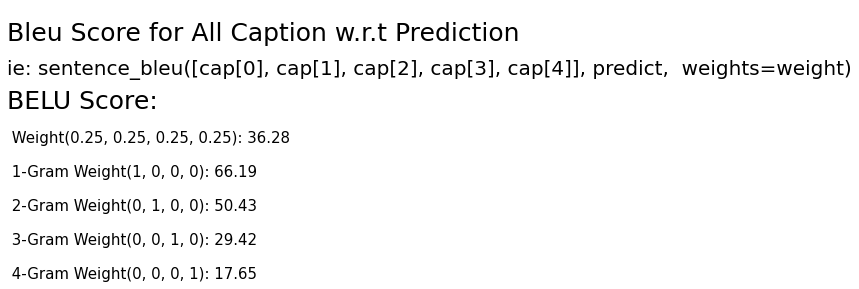

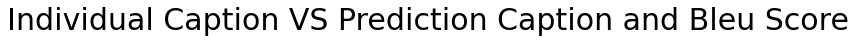

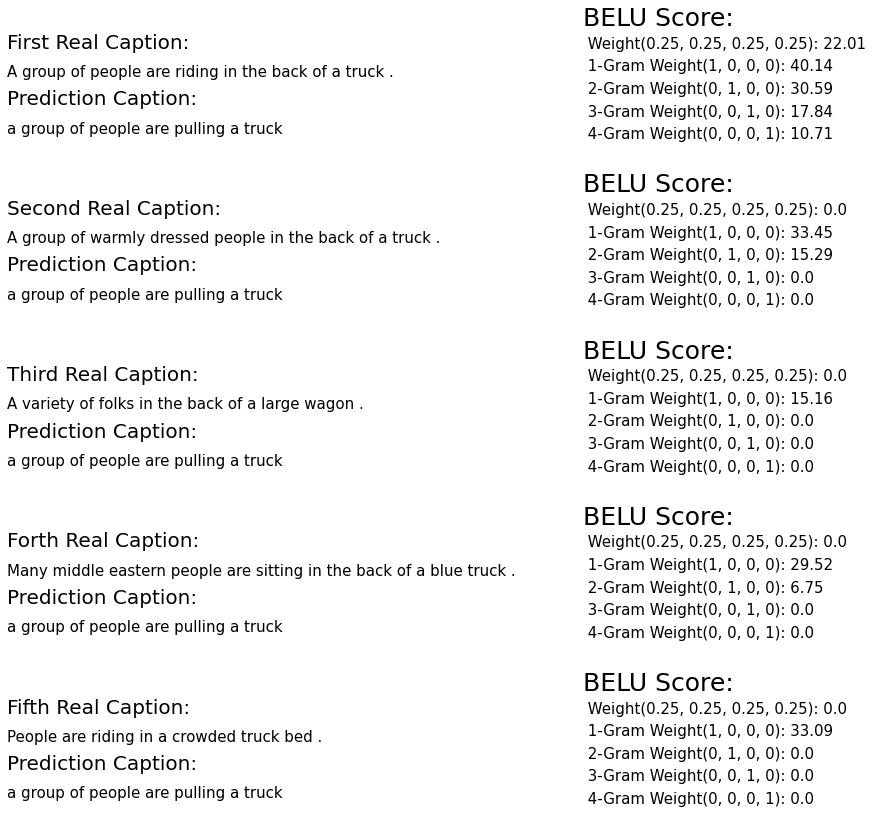

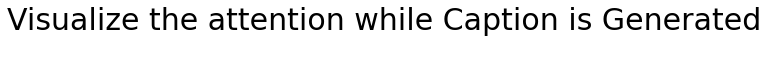

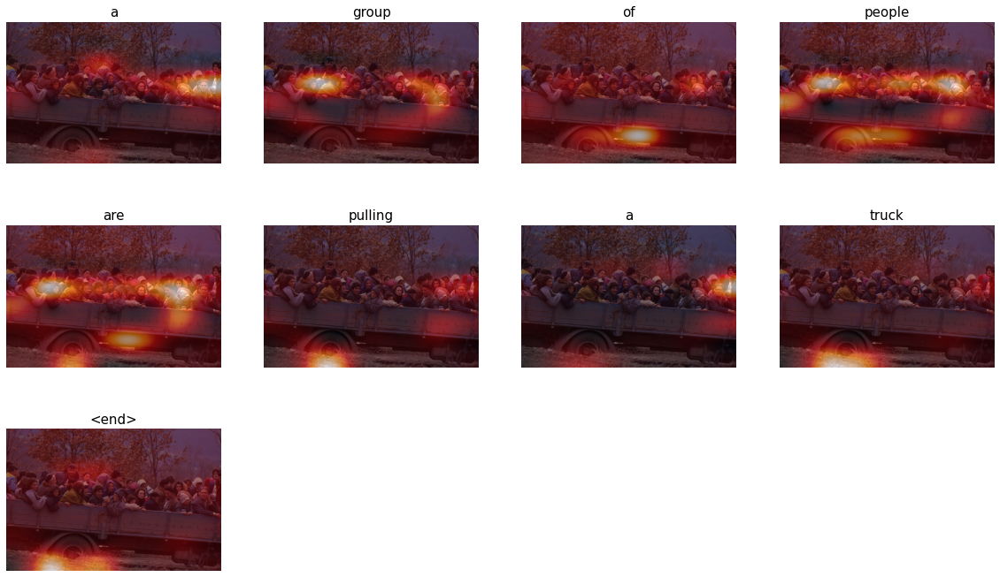

In [167]:
test_caption_generation(path_test)

## Evaluation with 6 Unseen Data

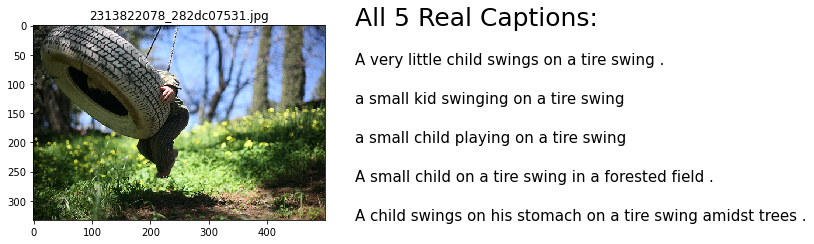

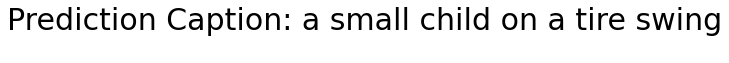

Prediction Caption:  a small child on a tire swing


PLAY THE AUDIO: 


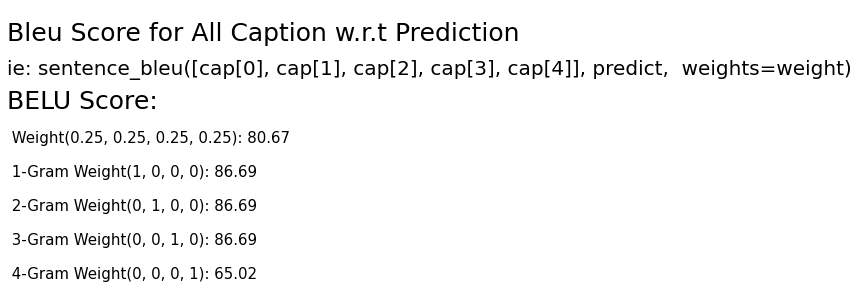

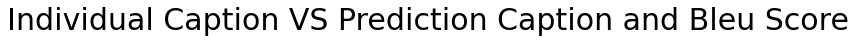

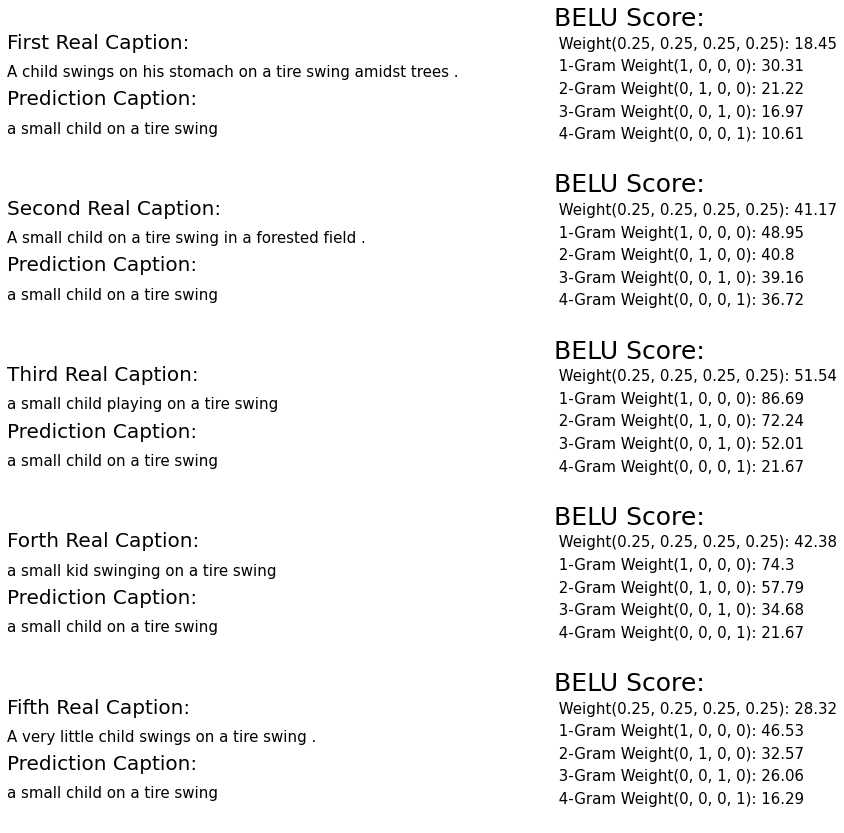

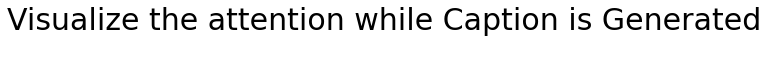

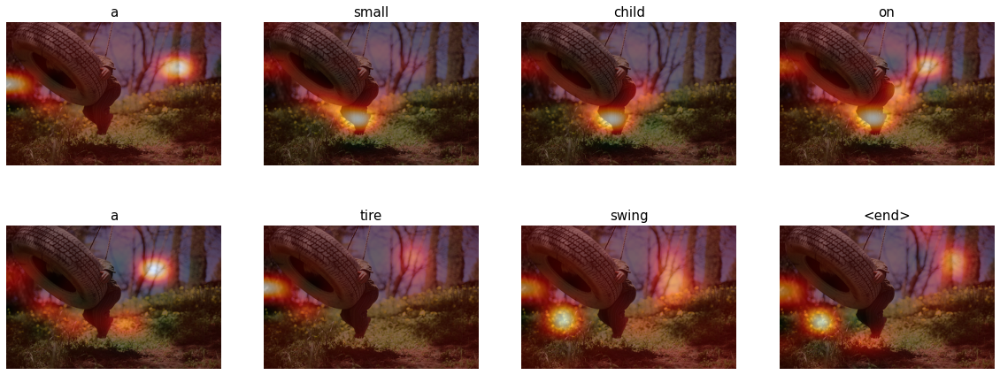

In [169]:
test_caption_generation(path_test)

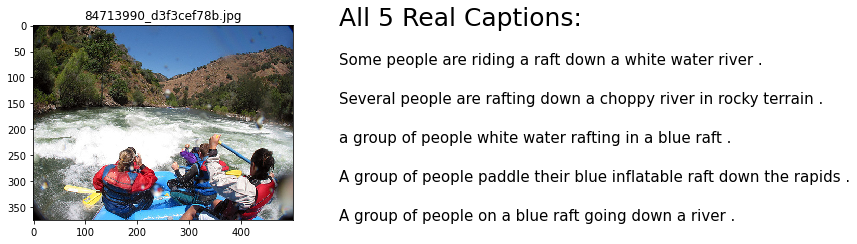

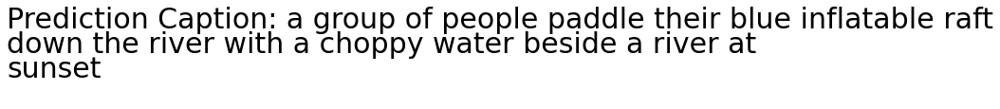

Prediction Caption:  a group of people paddle their blue inflatable raft down the river with a choppy water beside a river at sunset


PLAY THE AUDIO: 


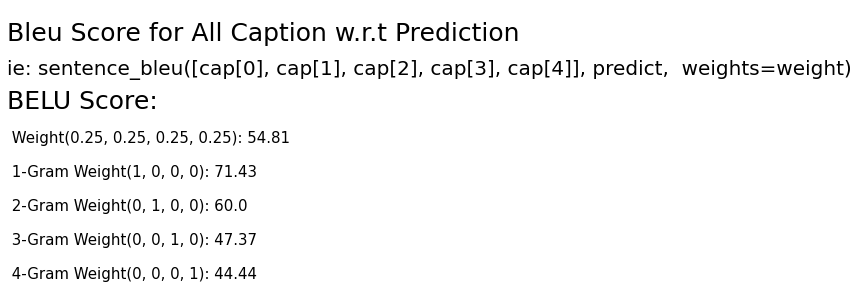

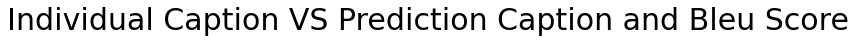

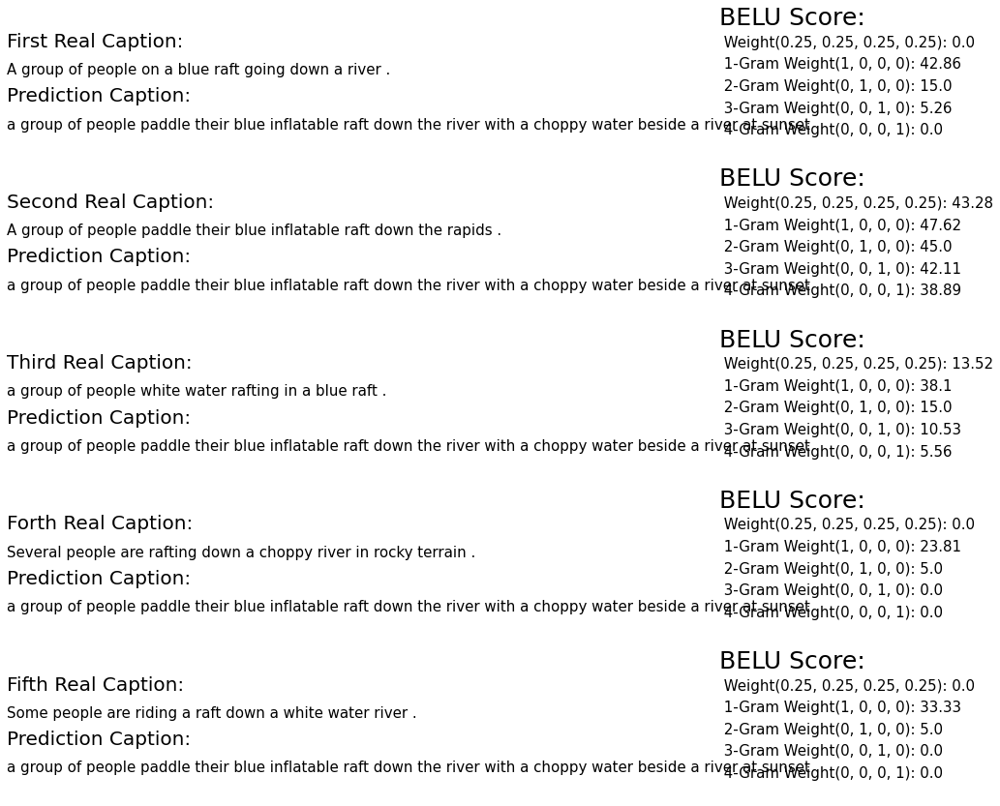

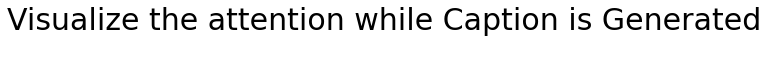

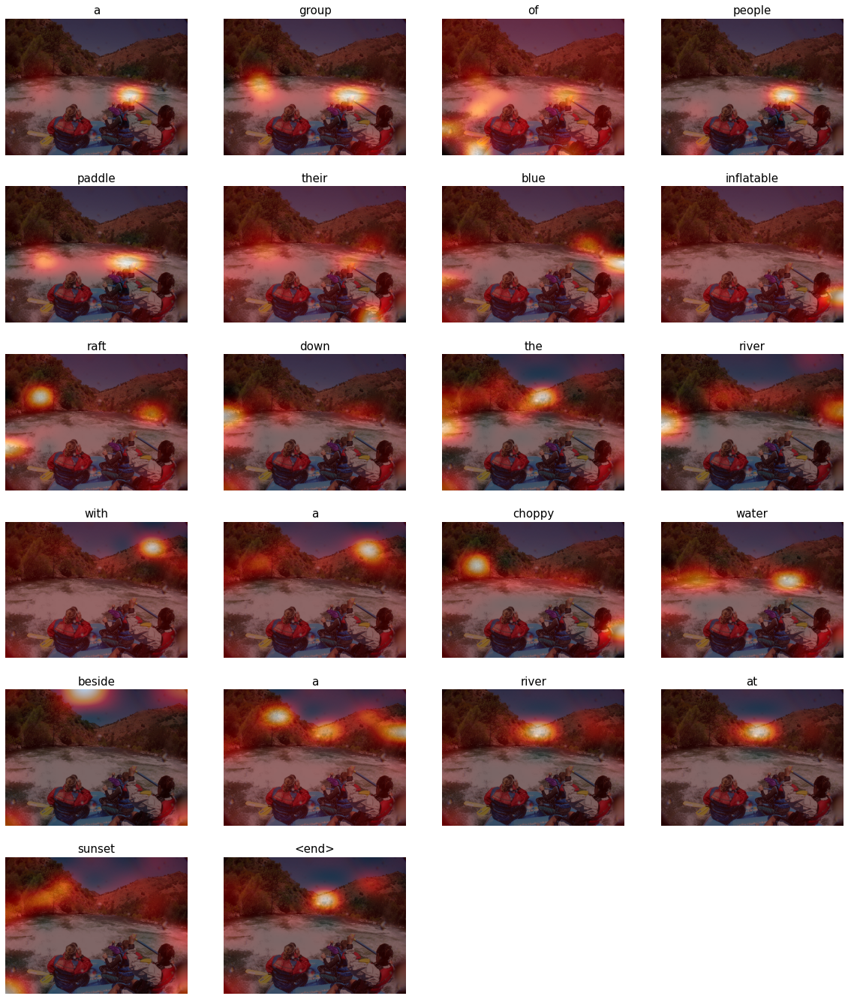

In [168]:
test_caption_generation(path_test)

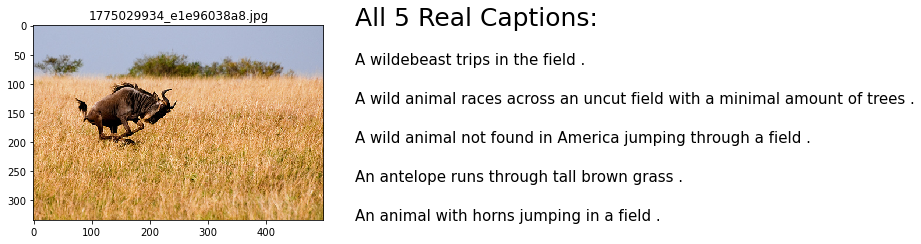

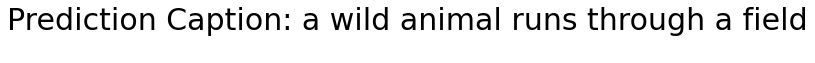

Prediction Caption:  a wild animal runs through a field


PLAY THE AUDIO: 


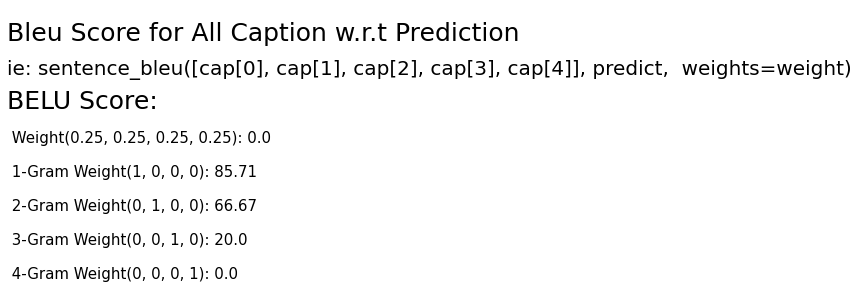

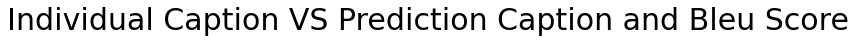

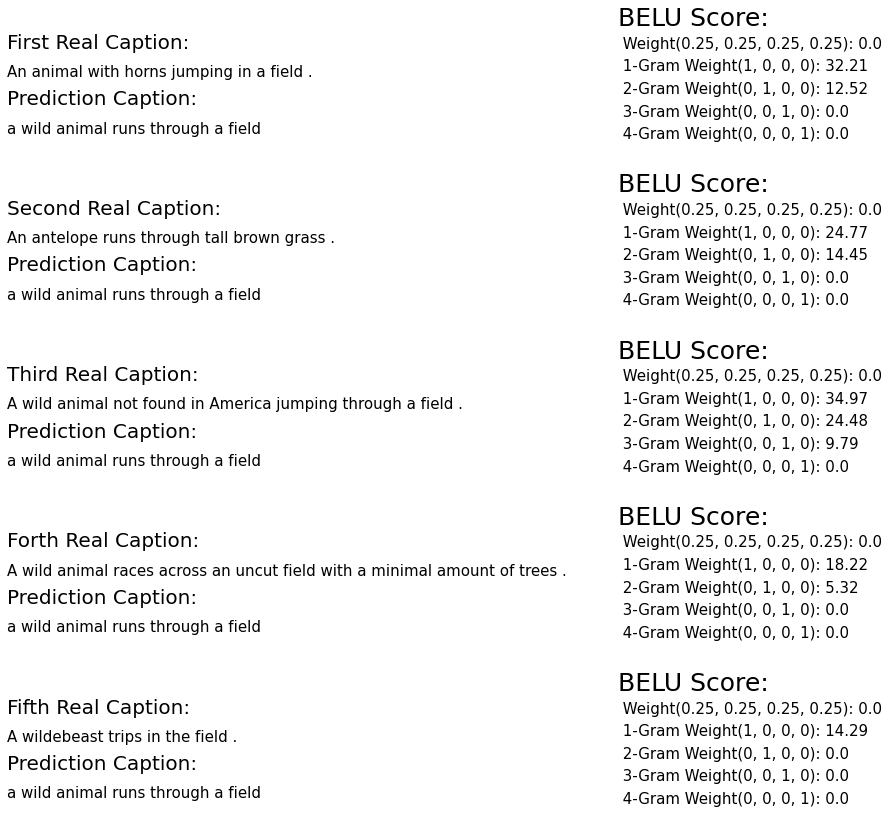

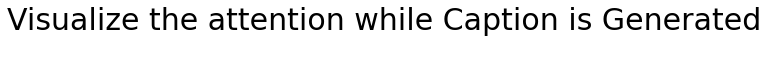

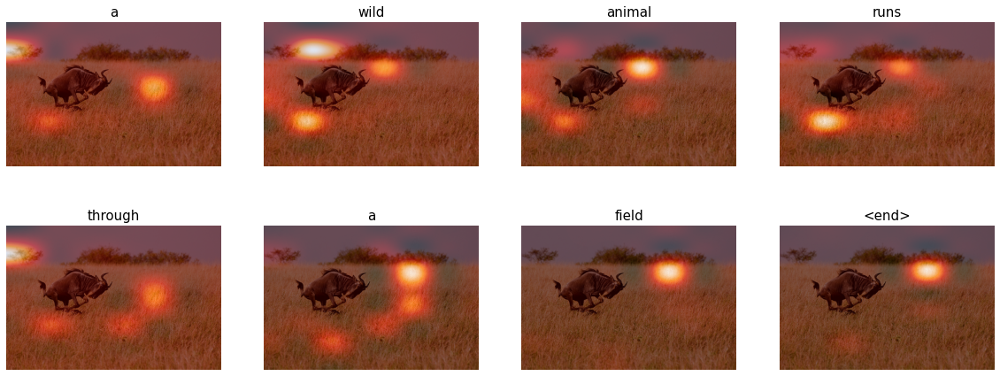

In [170]:
test_caption_generation(path_test)

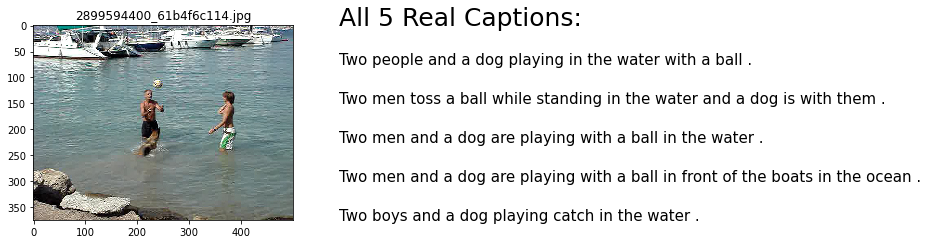

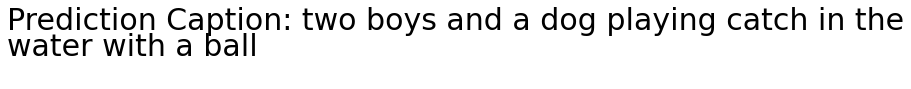

Prediction Caption:  two boys and a dog playing catch in the water with a ball


PLAY THE AUDIO: 


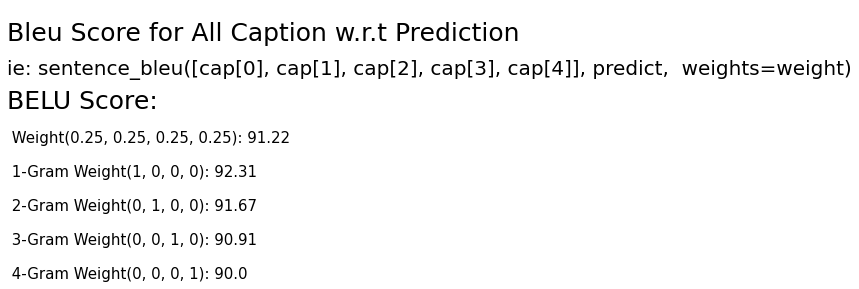

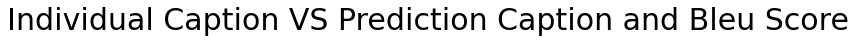

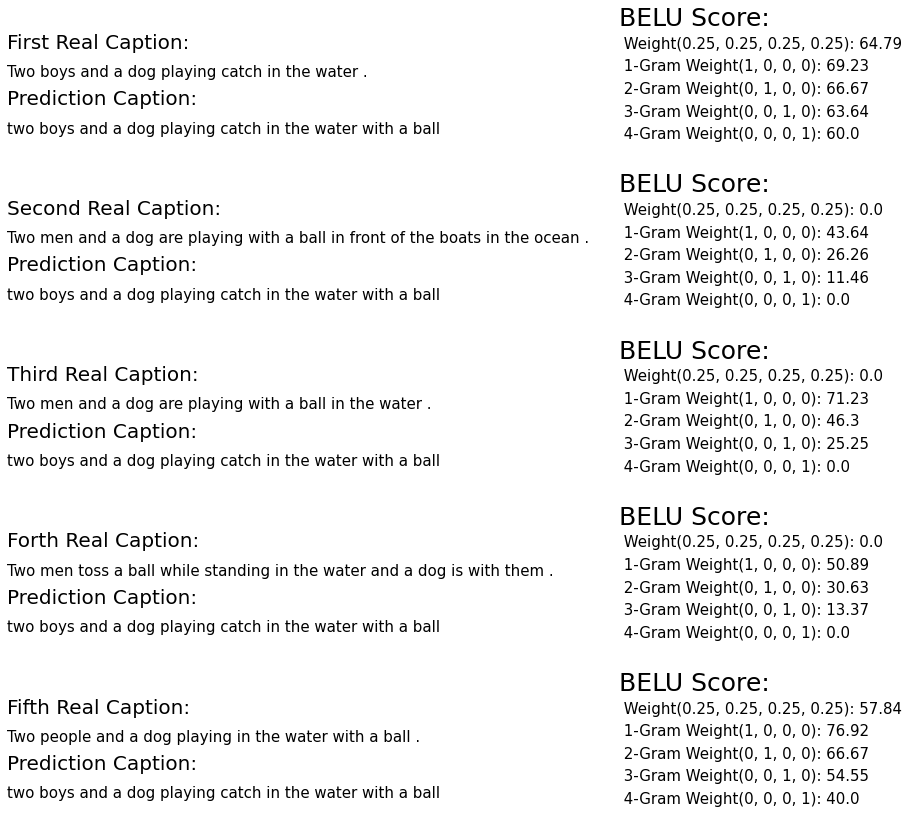

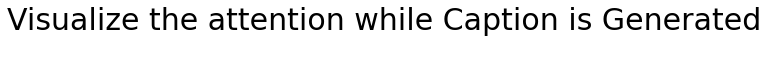

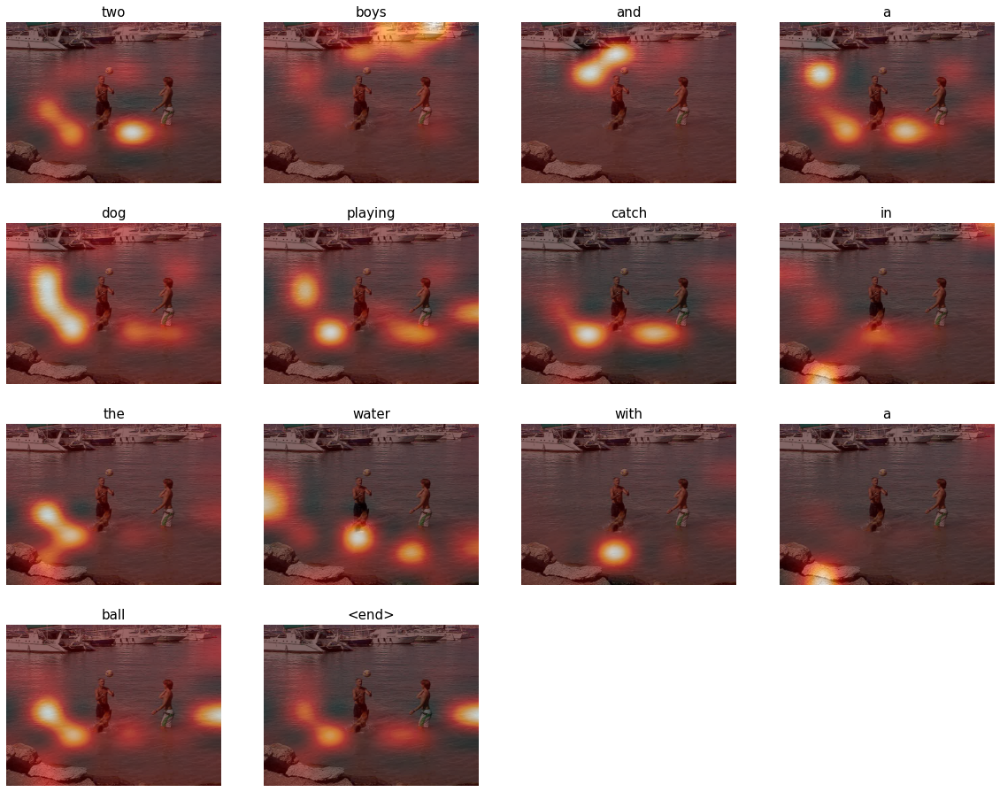

In [172]:
test_caption_generation(path_test)

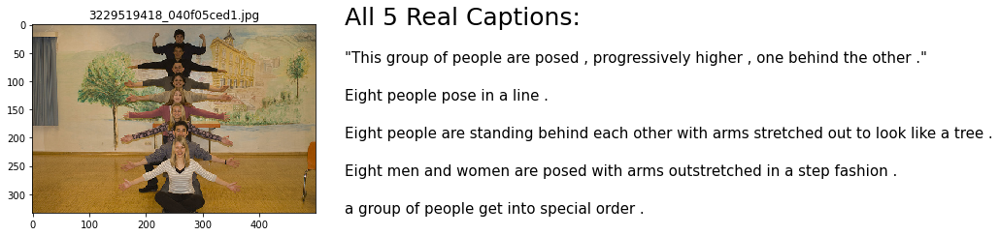

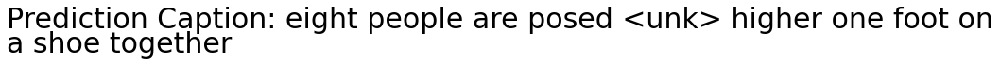

Prediction Caption:  eight people are posed <unk> higher one foot on a shoe together


PLAY THE AUDIO: 


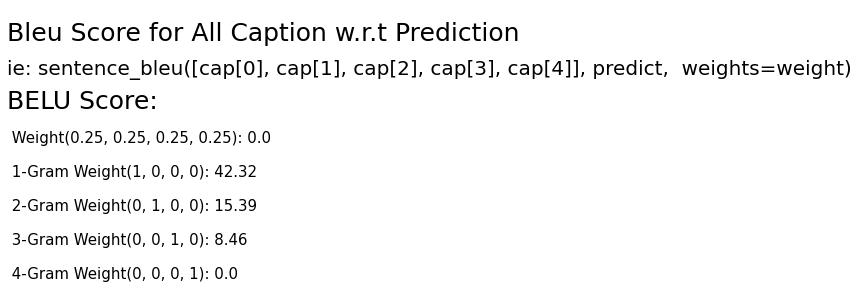

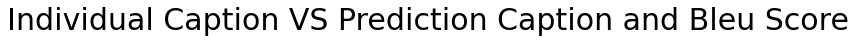

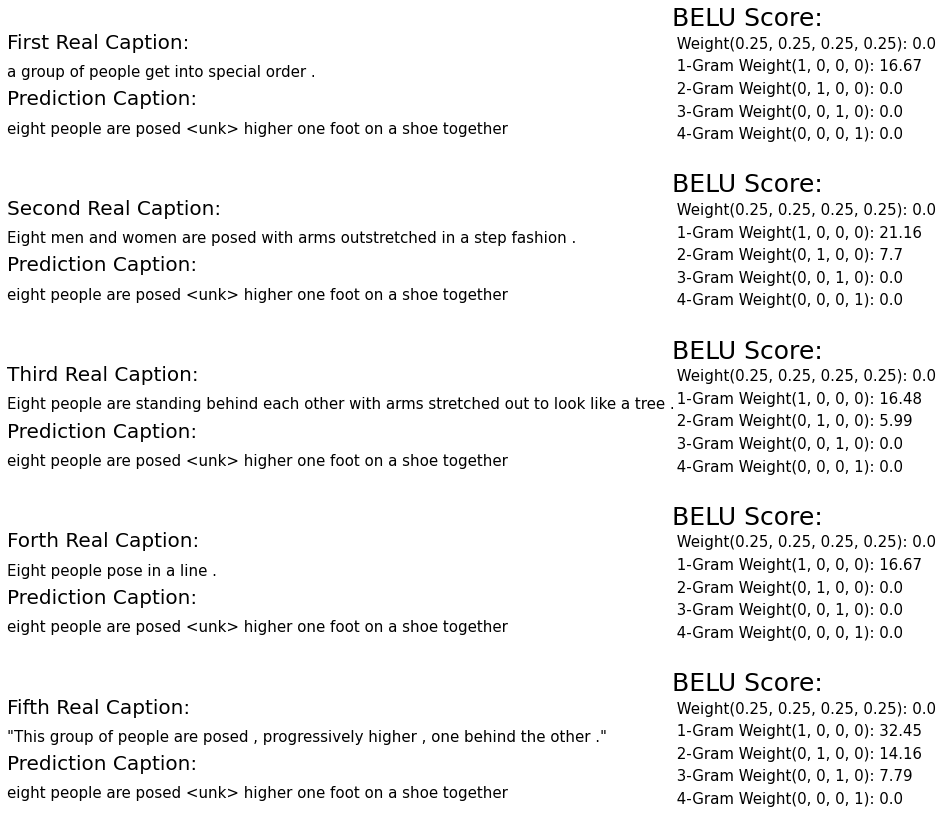

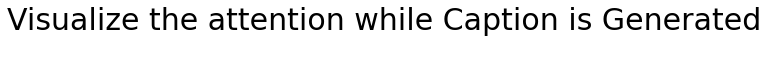

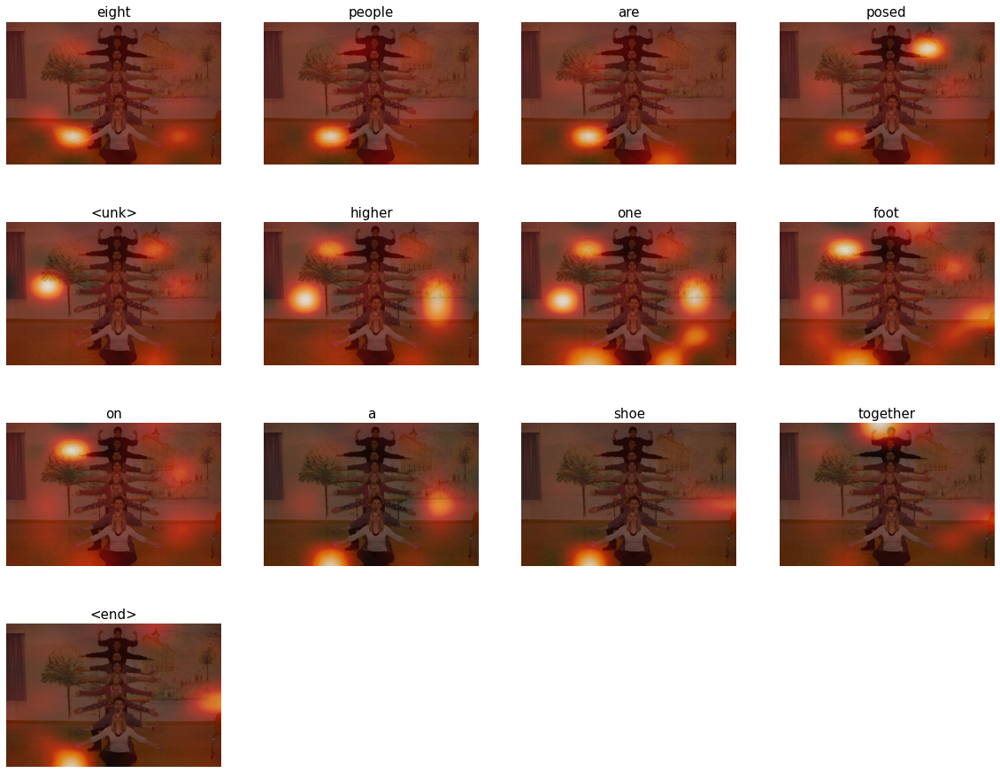

In [173]:
test_caption_generation(path_test)

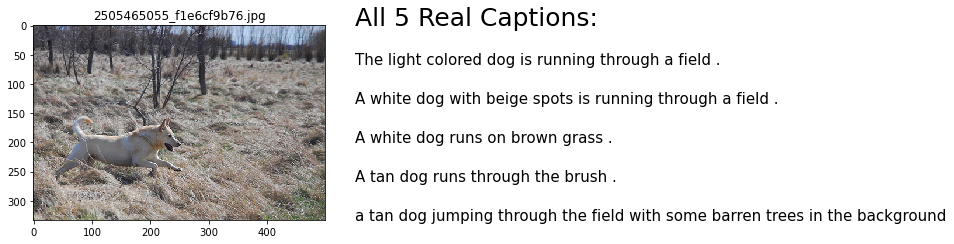

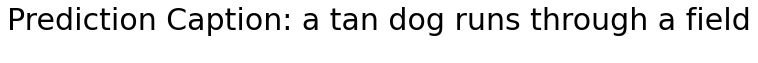

Prediction Caption:  a tan dog runs through a field


PLAY THE AUDIO: 


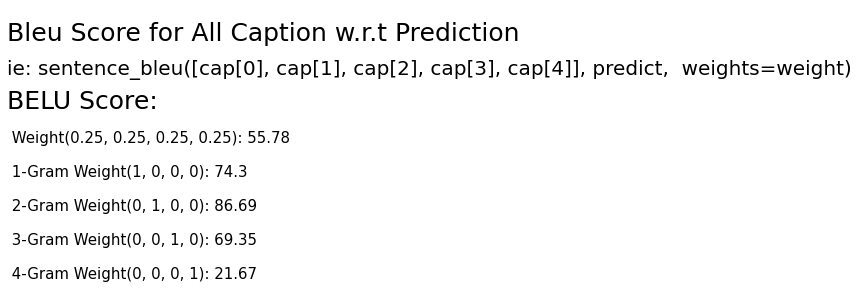

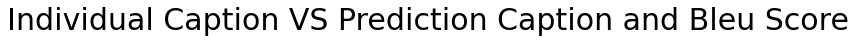

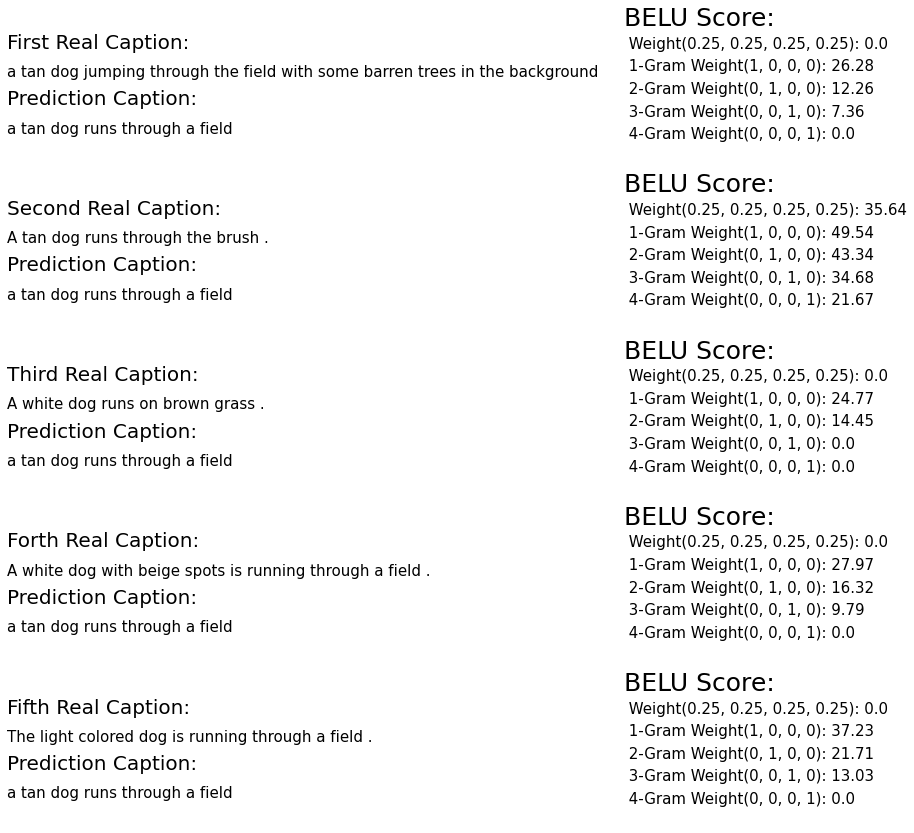

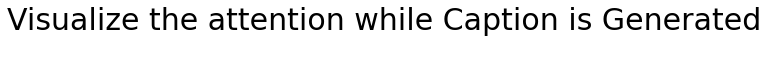

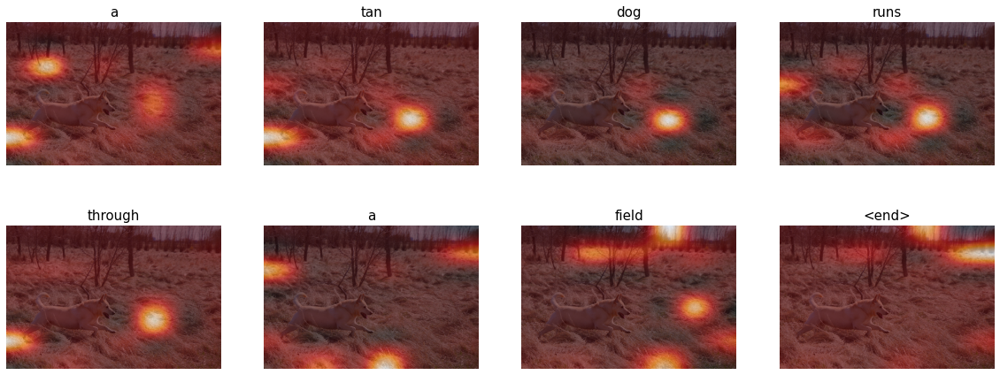

In [174]:
test_caption_generation(path_test)

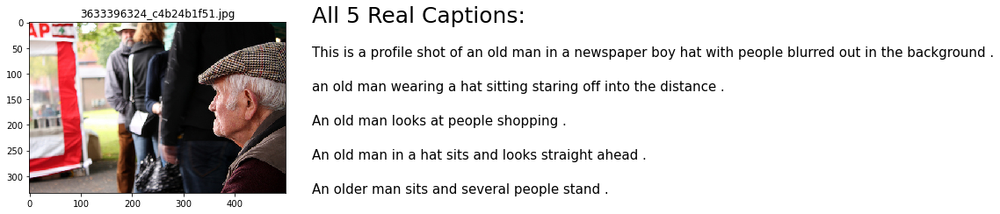

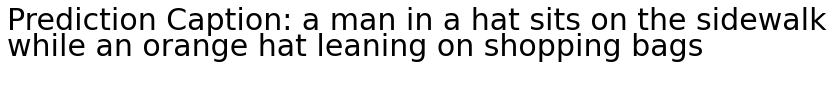

Prediction Caption:  a man in a hat sits on the sidewalk while an orange hat leaning on shopping bags


PLAY THE AUDIO: 


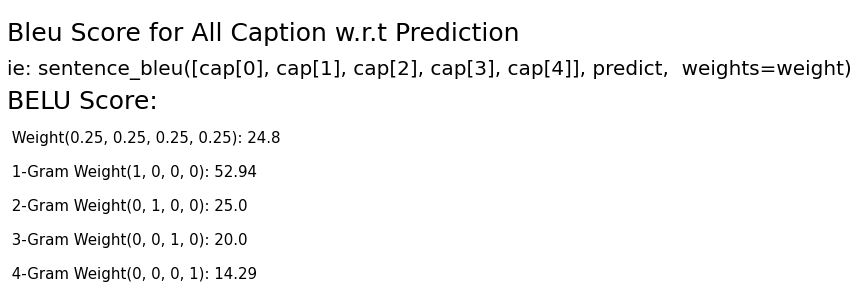

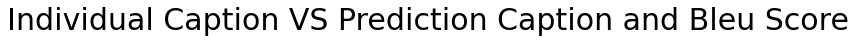

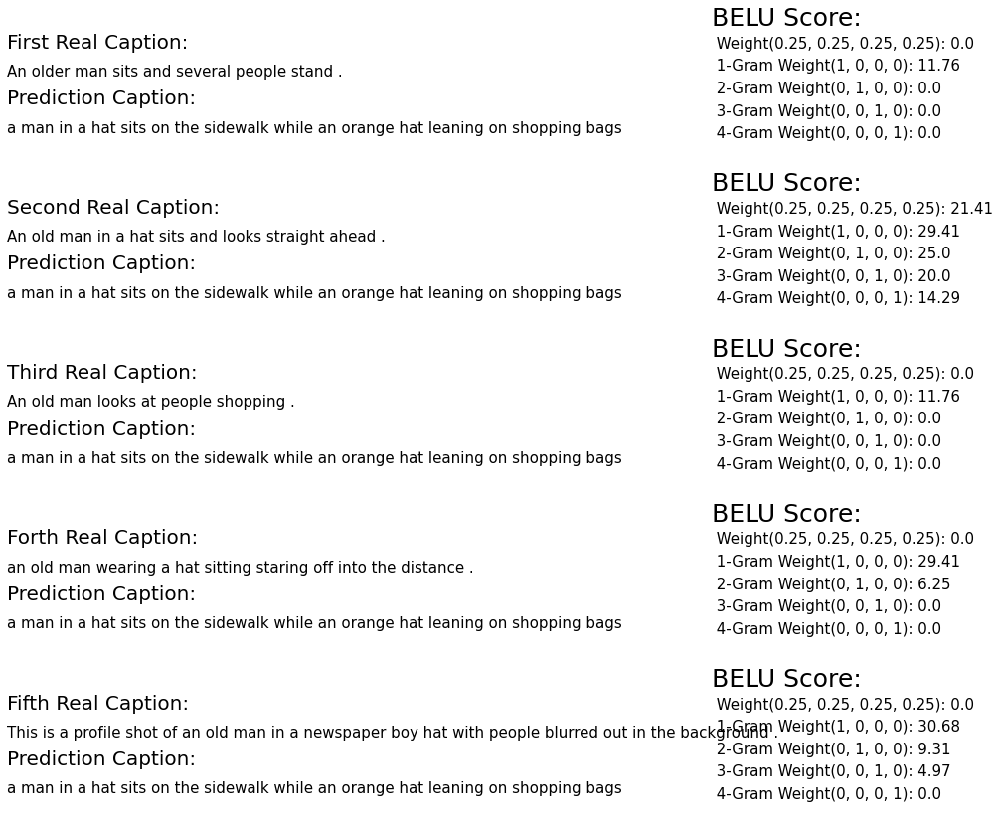

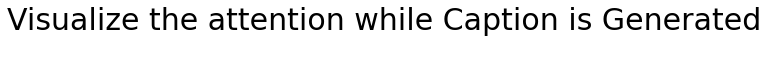

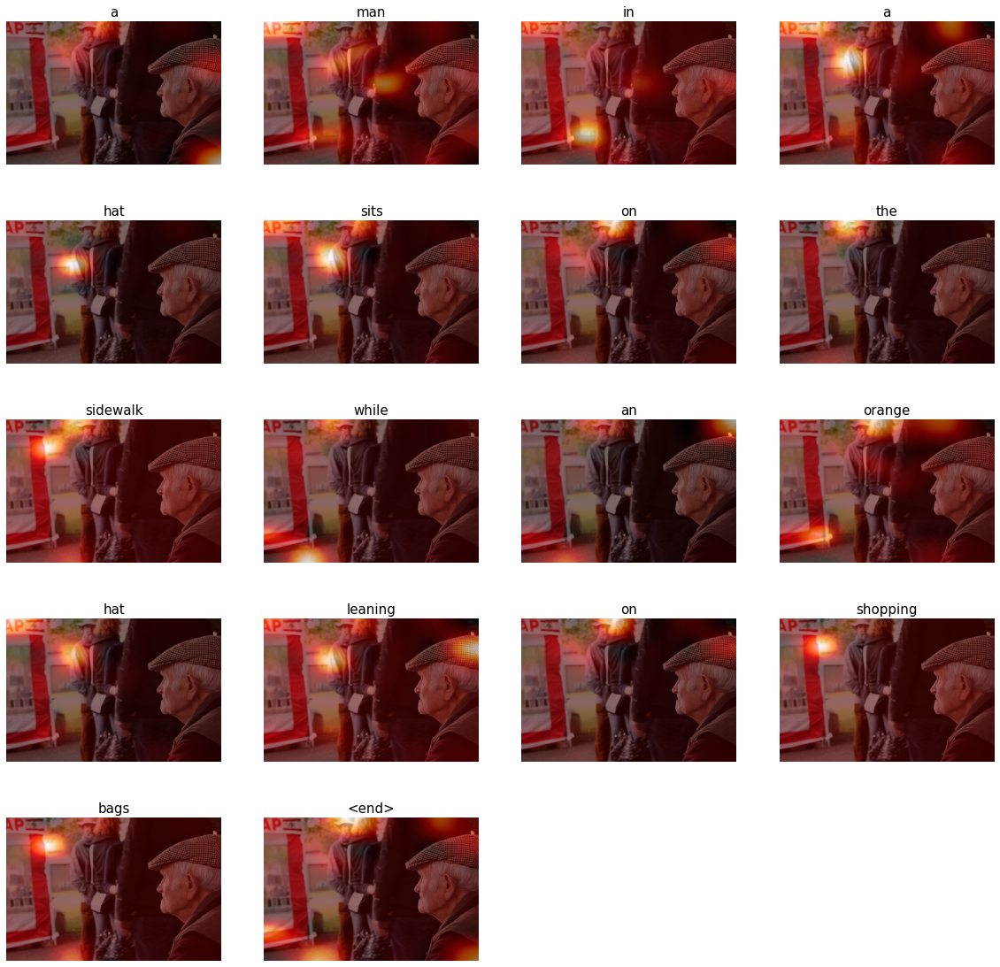

In [177]:
test_caption_generation(path_test)